# Sunset Sunrise Worldwide: Preparations <a class="tocSkip"></a>

_<a href= "mailto:alexander.dunkel@tu-dresden.de">Alexander Dunkel</a>, TU Dresden, Institute of Cartography;  Maximilian Hartmann, Universität Zürich (UZH), Geocomputation_

----------------

In [1]:
from IPython.display import Markdown as md
from datetime import date

today = date.today()
with open('/.version', 'r') as file: app_version = file.read().split("'")[1]
md(f"Last updated: {today.strftime('%b-%d-%Y')}, [Carto-Lab Docker](https://gitlab.vgiscience.de/lbsn/tools/jupyterlab) Version {app_version}")

Last updated: Aug-31-2022, [Carto-Lab Docker](https://gitlab.vgiscience.de/lbsn/tools/jupyterlab) Version 0.9.0

# Introduction

Based on data from Instagram and Flickr, we'll explore global reactions to sunsets and sunrises in these notebooks.

This is the first notebook in a series of nine notebooks:

1. the grid aggregation notebook (01_gridagg.ipynb) is used to aggregate data from HLL sets at GeoHash 5 to a 100x100km grid  
2. the visualization notebook (02_visualization.ipynb) is used to create interactive maps, with additional information shown on hover
3. the chimaps notebook (03_chimaps.ipynb) shows how to compute the chi square test per bin and event (sunset/sunrise).
4. the results notebook (04_combine.ipynb) shows how to combine results from sunset/sunrise into a single interactive map.
5. Notebooks 5 to 9 are used for creating additional graphics and statistics.

* Projections: [crs.Mollweide()](http://geoviews.org/user_guide/Projections.html) (epsg code ESRI:54009)

Use **Shift+Enter** to walk through the Notebook

**Install dependencies**

- Either use the [Carto-Lab Docker Container](https://gitlab.vgiscience.de/lbsn/tools/jupyterlab)
- or use the following steps to create an env in conda for running this notebook. Suggested using `miniconda` in WSL.

<details><summary><strong>Manual installation of dependencies</strong></summary>
<div style="width:800px">
<br>
<pre>
<code class="language-bash">
conda create -n sunset_env -c conda-forge
conda activate sunset_env
conda config --env --set channel_priority strict
conda config --show channel_priority # verify
# jupyter dependencies
conda install -c conda-forge 'ipywidgets=7.5.*' jupyterlab jupyterlab-git \
    jupytext jupyter_contrib_nbextensions jupyter_nbextensions_configurator
# visualization dependencies
conda install -c conda-forge geopandas jupyterlab "geoviews-core=1.9.5" \
    descartes mapclassify jupyter_contrib_nbextensions xarray \
    colorcet memory_profiler seaborn
# privacy aware dependencies
conda install -c conda-forge python-dotenv psycopg2
</code></pre>
<br>
to upgrade later, use:
<pre> 
<code class="language-bash">
conda upgrade -n sunset_env --all -c conda-forge
</code></pre>
<br>
Pinning geoviews to 1.9.5 should result in packages installed that are compatible with the code herein. For full compatibility, 
install exact versions as shown below ("Plot used package versions for future use").
<br>
To start the jupyter lab server:
<pre> 
<code class="language-bash">
conda activate sunset_env
jupyter lab
</code></pre>
</div>
</details>



# Preparations

## Load dependencies

In [2]:
import os
import csv
import sys
import colorcet
import psycopg2 # Postgres API
import geoviews as gv
import holoviews as hv
import mapclassify as mc
import geopandas as gp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geoviews.feature as gf
from pathlib import Path
from collections import namedtuple
from pathlib import Path
from typing import List, Tuple, Dict, Optional
from pyproj import Transformer, CRS, Proj
from geoviews import opts
from shapely.geometry import shape, Point, Polygon
from shapely.ops import transform
from cartopy import crs
from matplotlib import colors
from IPython.display import clear_output, display, HTML
from bokeh.models import HoverTool, FuncTickFormatter, FixedTicker
# optionally, enable shapely.speedups 
# which makes some of the spatial 
# queries running faster
import shapely.speedups as speedups
from shapely import geometry

Load helper module from `../py/module/tools.py`. This also allows us to import code from other jupyter notebooks, synced to `*.py` with jupytext.

In [3]:
module_path = str(Path.cwd().parents[0] / "py")
if module_path not in sys.path:
    sys.path.append(module_path)
from modules import tools, preparations

Initialize Bokeh and shapely.speedups

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
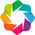

In [4]:
preparations.init_imports()

## Parameters

Define initial parameters that affect processing of data and graphics in all notebooks.

In [5]:
GRID_SIZE_METERS = 100000
"""The size of grid cells in meters 
(spatial accuracy of worldwide measurement)"""
CHUNK_SIZE = 5000000
"""Process x number of hll records per chunk.
Increasing this number will consume more memory,
but reduce processing time because less SQL queries
are needed."""
EPSG_CODE = 54009
CRS_PROJ = f"esri:{EPSG_CODE}"
"""Target projection: Mollweide (epsg code).
note: Mollweide defined by _esri_
in epsg.io's database"""
CRS_WGS = "epsg:4326"
"""Input projection (Web Mercator)"""
OUTPUT = Path.cwd().parents[0] / "out"
"""Define path to output directory (figures etc.)""";

We want to modify intermediate file names if not using a 100 km grid:

In [6]:
km_size = GRID_SIZE_METERS/1000
if km_size == 100:
    km_size_str = ""
else:
    km_size_str = f"_{km_size:.0f}km"

**Create paths**

In [7]:
def create_paths(
    output: str = OUTPUT, subfolders: List[str] = ["html", "pickles", "csv", "figures", "svg", "pdf"]):
    """Create subfolder for results to be stored"""
    output.mkdir(exist_ok=True)
    for subfolder in subfolders:
        Path(OUTPUT / f'{subfolder}{km_size_str}').mkdir(exist_ok=True)

In [8]:
create_paths()

**Plot used package versions for future use:**

In [9]:
root_packages = [
        'geoviews', 'geopandas', 'pandas', 'numpy', 'cloudpickle',
        'matplotlib', 'shapely', 'cartopy', 'holoviews',
        'mapclassify', 'fiona', 'bokeh', 'pyproj', 'ipython',
        'jupyterlab', 'xarray']
preparations.package_report(root_packages)

package,xarray,ipython,matplotlib,pyproj,bokeh,mapclassify,cloudpickle,numpy,holoviews,geoviews,Fiona,Shapely,pandas,Cartopy,geopandas
version,2022.6.0,8.4.0,3.5.3,3.2.1,2.4.3,2.4.3,2.1.0,1.22.4,1.14.8,1.9.5,1.8.20,1.7.1,1.4.3,0.20.1,0.11.1


## Folder structure and paths to data

The notebooks are synced to markdown and python files, through [jupytext](https://github.com/mwouts/jupytext), which in turn are managed in a git repository.

The data is exported from [hlldb](https://gitlab.vgiscience.de/lbsn/databases/hlldb) and stored as CSV files.

This notebook is based on the following folder structure:

```
.
├── 00_hll_data
|   ├── 2019-09-12_Flickr_Sunrise_World.csv
|   ├── 2019-09-11_Flickr_Sunset_World.csv
|   ├── 2020-02-24_Instagram_Sunrise_World.csv
|   ├── 2020-02-24_Instagram_Sunset_World.csv
|   └── 2019-09-22_Flickr_All_World.csv
└── 01_analysis
    ├──notebooks/
    |    ├──01_grid_agg.ipynb
    |    ├──02_visualization.ipynb
    |    ├──03_chimaps.ipynb
    |    └──03_combine.ipynb
    ├──out/
    |    ├──csv/
    |    ├──figures/
    |    ├──html/
    |    └──pickles/
    ├──md/
    ├──py/
    ├──.git
    └── README.md
```

To make this notebook cross-compatible for Linux and Windows users, use pathlib to format (`/`) paths:

In [10]:
root = Path.cwd().parents[1] / "00_hll_data"
SUNRISE_FLICKR = root / "2020-04-02_Flickr_Sunrise_World_HLL.csv"
SUNSET_FLICKR = root / "2020-04-08_Flickr_Sunset_World_HLL.csv"
ALL_FLICKR = root / "2020-09-22_Flickr_All_World_HLL.csv"
SUNRISE_INSTAGRAM = root / "2020-09-16_Instagram_sunrise_World_HLL.csv"
SUNSET_INSTAGRAM = root / "2020-09-16_Instagram_sunset_World_HLL.csv"
RANDOM_INSTAGRAM = root / "2022-04-13_Instagram_Random_World_HLL.csv"

## Dataset Preview

First, some statistics for these files:

In [11]:
%%time
data_files = {
    "SUNRISE_FLICKR":SUNRISE_FLICKR,
    "SUNSET_FLICKR":SUNSET_FLICKR,
    "ALL_FLICKR":ALL_FLICKR,
    "SUNRISE_INSTAGRAM":SUNRISE_INSTAGRAM,
    "SUNSET_INSTAGRAM":SUNSET_INSTAGRAM,
    "RANDOM_INSTAGRAM":RANDOM_INSTAGRAM,
    }
tools.display_file_stats(data_files)

name,SUNRISE_FLICKR,SUNSET_FLICKR,ALL_FLICKR,SUNRISE_INSTAGRAM,SUNSET_INSTAGRAM,RANDOM_INSTAGRAM
size,53.97 MB,86.81 MB,1.28 GB,34.68 MB,100.61 MB,280.43 MB
records,"471,447","1,452,351","6,492,871","296,385","593,960","346,385"


CPU times: user 1.56 s, sys: 349 ms, total: 1.91 s
Wall time: 1.91 s


Note that HLL-Data is already pre-aggregated using a GeoHash of 5. Thus, the actual number of records is lower than the total number of posts reflected in these HLL sets.

Data structure of sunrise and sunset is the same. Dataset 'Flickr_All_world' differs. Example structure of `SUNRISE_INSTAGRAM` (first 3 records):

In [12]:
pd.set_option('display.max_colwidth', 150)
tools.record_preview_hll(SUNRISE_INSTAGRAM)

,0
Record 0,
lat,-89.9972534179688
lng,-158.900756835938
user_hll,\x138b406261
post_hll,\x138b406901
date_hll,\x138b404622


,0
Record 1,
lat,-89.9972534179688
lng,0.0054931640625
user_hll,\x138b407024
post_hll,\x138b402021fea1
date_hll,\x138b4074428722


,0
Record 2,
lat,-89.8818969726562
lng,-130.962524414062
user_hll,\x138b4017425281b622b901c6a2e2e1ff02
post_hll,\x138b400d8136c4714172e28a61a501b0e1b622bac2cbc5
date_hll,\x138b400ac10f02760281218721b523d162d6e1


## Preparations for HLL calculation

Password and username for connecting to local [hllworker](https://gitlab.vgiscience.de/lbsn/databases/pg-hll-empty) are loaded from environment.

Define credentials as environment variables and load here

In [13]:
DB_USER = "postgres"
DB_PASS = os.getenv('POSTGRES_PASSWORD')
# set connection variables
DB_HOST = "lbsn-hlldb-sunset"
DB_PORT = "5432"
DB_NAME = "lbsn-hlldb"

Connect to empty Postgres database running HLL Extension:

In [14]:
DB_CONN = psycopg2.connect(
        host=DB_HOST,
        port=DB_PORT ,
        dbname=DB_NAME,
        user=DB_USER,
        password=DB_PASS
)
DB_CONN.set_session(
    readonly=True)
DB_CALC = tools.DbConn(
    DB_CONN)
CUR_HLL = DB_CONN.cursor()

Test connection:

In [15]:
CUR_HLL.execute("SELECT 1;")
print(CUR_HLL.statusmessage)

SELECT 1


## Create Grid

1. Define Mollweide crs string for pyproj/Proj4 and WGS1984 for Social Media imports

In [16]:
# define Transformer ahead of time
# with xy-order of coordinates
PROJ_TRANSFORMER = Transformer.from_crs(
    CRS_WGS, CRS_PROJ, always_xy=True)

# also define reverse projection
PROJ_TRANSFORMER_BACK = Transformer.from_crs(
    CRS_PROJ, CRS_WGS, always_xy=True)

2. create bounds from WGS1984 and project to Mollweide

In [17]:
XMIN = PROJ_TRANSFORMER.transform(
    -180, 0)[0]
XMAX = PROJ_TRANSFORMER.transform(
    180, 0)[0]
YMAX = PROJ_TRANSFORMER.transform(
    0, 90)[1]
YMIN = PROJ_TRANSFORMER.transform(
    0, -90)[1]

In [18]:
print(f'Projected bounds: {[XMIN, YMIN, XMAX, YMAX]}')

Projected bounds: [-18040095.696147293, -9020047.848073646, 18040095.696147293, 9020047.848073646]


3. Create 100x100 km (e.g.) Grid

In [19]:
def create_grid_df(
    grid_size: int = GRID_SIZE_METERS,
    xmin: float = XMIN, ymin: float = YMIN, 
    xmax: float = XMAX, ymax: float = YMAX,
    report: bool = None,
    return_rows_cols: bool = None):
    """Creates dataframe polygon grid based on width and length in Meters"""
    width = grid_size
    length = grid_size
    cols = list(range(int(np.floor(xmin)), int(np.ceil(xmax)), width))
    rows = list(range(int(np.floor(ymin)), int(np.ceil(ymax)), length))
    if report:
        print(len(cols))
        print(len(rows))
    rows.reverse()
    
    polygons = []
    for x in cols:
        for y in rows:
            # combine to tuple: (x,y, poly)
            # and append to list
            polygons.append(
                (x, y, 
                 Polygon([
                     (x,y), 
                     (x+width, y), 
                     (x+width, y-length), 
                     (x, y-length)])) )
    # create a pandas dataframe
    # from list of tuples
    grid = pd.DataFrame(polygons)
    # name columns
    col_labels=['xbin', 'ybin', 'bin_poly']
    grid.columns = col_labels
    # use x and y as index columns
    grid.set_index(['xbin', 'ybin'], inplace=True)
    if return_rows_cols:
        return grid, rows, cols
    return grid

In [20]:
grid, rows, cols = create_grid_df(
    grid_size=GRID_SIZE_METERS,
    report=True, return_rows_cols=True)

361
181


In [21]:
grid.head()

bin_poly
xbin      ybin                                                                                                              
-18040096 8979952  POLYGON ((-18040096 8979952, -17940096 8979952, -17940096 8879952, -18040096 8879952, -18040096 8979952))
          8879952  POLYGON ((-18040096 8879952, -17940096 8879952, -17940096 8779952, -18040096 8779952, -18040096 8879952))
          8779952  POLYGON ((-18040096 8779952, -17940096 8779952, -17940096 8679952, -18040096 8679952, -18040096 8779952))
          8679952  POLYGON ((-18040096 8679952, -17940096 8679952, -17940096 8579952, -18040096 8579952, -18040096 8679952))
          8579952  POLYGON ((-18040096 8579952, -17940096 8579952, -17940096 8479952, -18040096 8479952, -18040096 8579952))

Create a geodataframe from dataframe:

In [22]:
def grid_to_gdf(
    grid: pd.DataFrame, crs_proj: str = CRS_PROJ) -> gp.GeoDataFrame:
    """Convert grid pandas DataFrame to geopandas Geodataframe"""
    grid = gp.GeoDataFrame(
        grid.drop(
            columns=["bin_poly"]),
            geometry=grid.bin_poly)
    grid.crs = crs_proj
    return grid

In [23]:
grid = grid_to_gdf(grid)

Add columns for aggregation

In [24]:
def reset_metrics(
    grid: gp.GeoDataFrame,
    metrics: List[str] = [
        "postcount_est", "usercount_est", "userdays_est",
        "postcount_hll", "usercount_hll", "userdays_hll"],
    setzero: bool = None):
    """Remove columns from GeoDataFrame and optionally fill with 0"""
    for metric in metrics:
        try:
            grid.drop(metric, axis=1, inplace=True)
            grid.drop(f'{metric}_cat', axis=1, inplace=True)
        except KeyError:
            pass
        if setzero:
            grid.loc[:, metric] = 0

In [25]:
reset_metrics(grid)
display(grid)

geometry
xbin      ybin                                                                                                                                                       
-18040096  8979952  POLYGON ((-18040096.000 8979952.000, -17940096.000 8979952.000, -17940096.000 8879952.000, -18040096.000 8879952.000, -18040096.000 8979952.000))
           8879952  POLYGON ((-18040096.000 8879952.000, -17940096.000 8879952.000, -17940096.000 8779952.000, -18040096.000 8779952.000, -18040096.000 8879952.000))
           8779952  POLYGON ((-18040096.000 8779952.000, -17940096.000 8779952.000, -17940096.000 8679952.000, -18040096.000 8679952.000, -18040096.000 8779952.000))
           8679952  POLYGON ((-18040096.000 8679952.000, -17940096.000 8679952.000, -17940096.000 8579952.000, -18040096.000 8579952.000, -18040096.000 8679952.000))
           8579952  POLYGON ((-18040096.000 8579952.000, -17940096.000 8579952.000, -17940096.000 8479952.000, -18040096.000 8479952.000, -18040096.000 8579952.000))
...                                                                                                                                                               ...
 17959904 -8620048  POLYGON ((17959904.000 -8620048.000, 18059904.000 -8620048.000, 18059904.000 -8720048.000, 17959904.000 -8720048.000, 17959904.000 -8620048.000))
          -8720048  POLYGON ((17959904.000 -8720048.000, 18059904.000 -8720048.000, 18059904.000 -8820048.000, 17959904.000 -8820048.000, 17959904.000 -8720048.000))
          -8820048  POLYGON ((17959904.000 -8820048.000, 18059904.000 -8820048.000, 18059904.000 -8920048.000, 17959904.000 -8920048.000, 17959904.000 -8820048.000))
          -8920048  POLYGON ((17959904.000 -8920048.000, 18059904.000 -8920048.000, 18059904.000 -9020048.000, 17959904.000 -9020048.000, 17959904.000 -8920048.000))
          -9020048  POLYGON ((17959904.000 -9020048.000, 18059904.000 -9020048.000, 18059904.000 -9120048.000, 17959904.000 -9120048.000, 17959904.000 -9020048.000))

[65341 rows x 1 columns]

**Read World geometries data**

In [26]:
%%time
world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'), crs=CRS_WGS)
world = world.to_crs(CRS_PROJ)

CPU times: user 63.1 ms, sys: 0 ns, total: 63.1 ms
Wall time: 62.4 ms


### Preview Grid

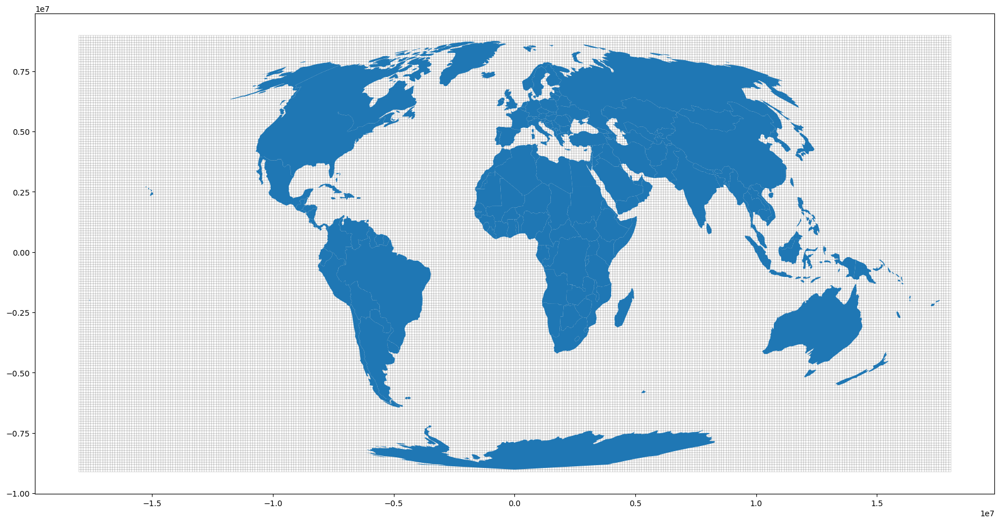

In [27]:
base = grid.plot(figsize=(22,28), color='white', edgecolor='black', linewidth=0.1)
# combine with world geometry
plot = world.plot(ax=base)

# Prepare binary search

The aggregation speed is important here and we should not use polygon intersection. Since we're working with a regular grid and floating point numbers, a [binary search](https://en.wikipedia.org/wiki/Binary_search_algorithm) is likely one of the fastest ways for our context. [numpy.digitize](https://docs.scipy.org/doc/numpy/reference/generated/numpy.digitize.html) provides a binary search, but it must be adapted to for the spatial context. A lat or lng value is assigned to the nearest bin matching. We get our lat and lng bins from our original Mollweide grid, which are regularly spaced at 100km interval. Note that we need to do two binary searches, for lat and for lng values.

## Create test points

In [28]:
testpoint = Point(8.546377, 47.392323)
testpoint2 = Point(13.726359, 51.028512)
testpoint3 = Point(13.71389, 46.52278) # Dreiländereck
gdf_testpoints = gp.GeoSeries([testpoint, testpoint2, testpoint3], crs=CRS_WGS)
# project geometries to Mollweide
gdf_testpoints_proj = gdf_testpoints.to_crs(CRS_PROJ)
display(gdf_testpoints_proj[0].x)

671646.5840955656

Preview map for testpoint

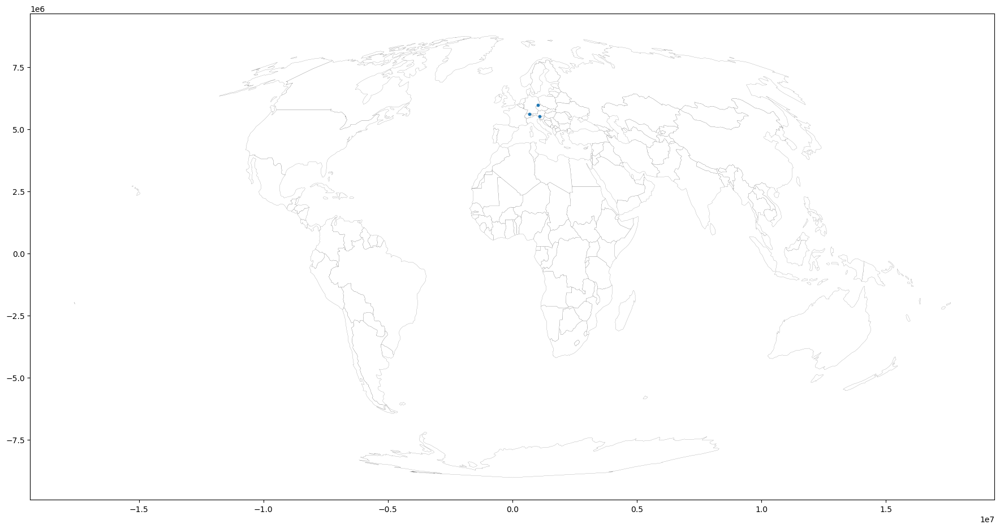

In [29]:
base = world.plot(figsize=(22,28), color='white', edgecolor='black', linewidth=0.1)
plot = gdf_testpoints_proj.plot(ax=base, markersize=10)

### Use np.digitize() to assign coordinates to the grid

> [np.digitize](https://docs.scipy.org/doc/numpy/reference/generated/numpy.digitize.html) is implemented in terms of np.searchsorted. This means that a binary search is used to bin the values, which scales much better for larger number of bins than the previous linear search. It also removes the requirement for the input array to be 1-dimensional.

Create 2 bins for each axis of existing Mollweide rows/cols grid:

In [30]:
ybins = np.array(rows)
xbins = np.array(cols)

Create 2 lists with a single entry (testpoint coordinate)

In [31]:
test_point_list_x = np.array([p.x for p in gdf_testpoints_proj])
test_point_list_y = np.array([p.y for p in gdf_testpoints_proj])

Find the nearest bin for x coordinate (returns the bin-index):

In [32]:
x_bin = np.digitize(test_point_list_x, xbins) - 1
display(x_bin)

array([187, 190, 191])

Check value of bin (the y coordinate) based on returned index:

In [33]:
testpoint_xbin_idx = xbins[[x_bin[x] for x in range(0, len(x_bin))]]
display(testpoint_xbin_idx)

array([ 659904,  959904, 1059904])

Repeat the same for y-testpoint:

In [34]:
y_bin = np.digitize(test_point_list_y, ybins) - 1
display(y_bin)

array([33, 29, 34])

In [35]:
testpoint_ybin_idx = ybins[[y_bin[x] for x in range(0, len(y_bin))]]
display(testpoint_ybin_idx)

array([5679952, 6079952, 5579952])

➡️ **759904** / **5579952** and **1059904** / **5979952** are indexes that we can use in our geodataframe index to return the matching grid-poly for each point

### Highlight Testpoint in Grid

Get grid-poly by index from testpoint

In [36]:
grid.loc[testpoint_xbin_idx[0], testpoint_ybin_idx[0]]

geometry    POLYGON ((659904.000 5679952.000, 759904.000 5679952.000, 759904.000 5579952.000, 659904.000 5579952.000, 659904.000 5679952.000))
Name: (659904, 5679952), dtype: geometry

Convert shapely bin poly to Geoseries and plot

<AxesSubplot:>

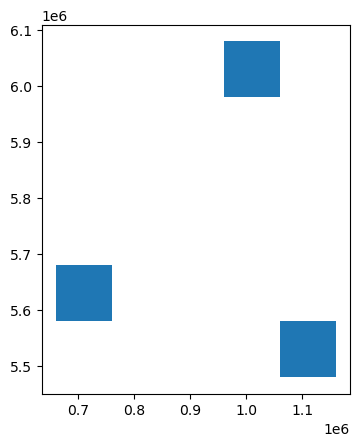

In [37]:
testpoint_grids = gp.GeoSeries(
    [grid.loc[testpoint_xbin_idx[x], testpoint_ybin_idx[x]].geometry for x in range(0,len(gdf_testpoints))])
testpoint_grids.plot()

### Preview map with testpoint and assigned bin

Set auto zoom with buffer:

In [38]:
minx, miny, maxx, maxy = testpoint_grids.total_bounds
buf = 1000000

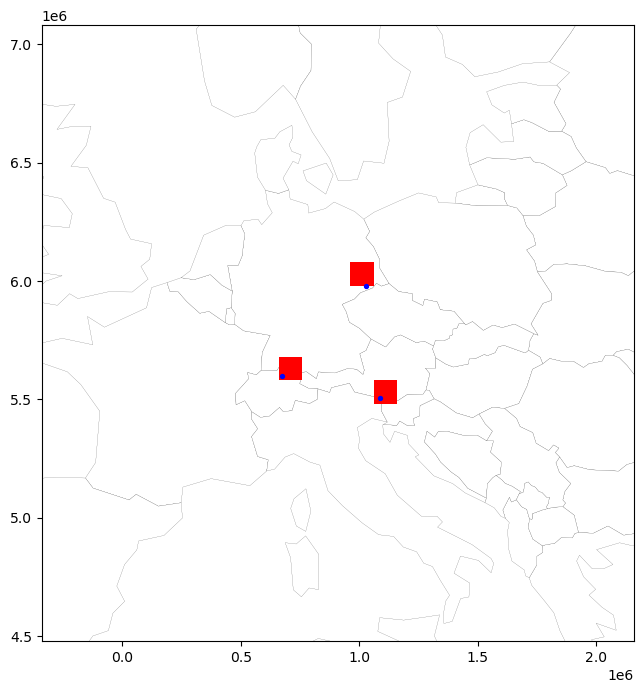

In [39]:
# a figure with a 1x1 grid of Axes
fig, ax = plt.subplots(1, 1,figsize=(10,8))
ax.set_xlim(minx-buf, maxx+buf)
ax.set_ylim(miny-buf, maxy+buf)
base = world.plot(ax=ax, color='white', edgecolor='black', linewidth=0.1)
grid_base = testpoint_grids.plot(ax=base, facecolor='red', linewidth=0.1)
plot = gdf_testpoints_proj.plot(ax=grid_base, markersize=8, color='blue')

## Prepare functions

Now that it has been visually verified that the algorithm works, lets create functions for the main processing job.

In [40]:
def get_best_bins(
    search_values_x: np.array, search_values_y: np.array,
    xbins: np.array, ybins: np.array) -> Tuple[np.ndarray, np.ndarray]:
    """Will return best bin for a lat and lng input
    
    Note: prepare bins and values in correct matching projection
    
    Args:
        search_values_y: A list of projected latitude values
        search_values_x: A list of projected longitude values
        xbins: 1-d array of bins to snap lat/lng values
        ybins: 1-d array of bins to snap lat/lng values

    Returns:
        Tuple[int, int]: A list of tuples with 2 index positions for the best 
            matching bins for each lat/lng
    """
    xbins_idx = np.digitize(search_values_x, xbins, right=False)
    ybins_idx = np.digitize(search_values_y, ybins, right=False)
    return (xbins[xbins_idx-1], ybins[ybins_idx-1])

## Test with LBSN data

We're going to test the binning of coordinates on a small subset (Europe).

Prepare lat/lng tuple of lower left corner and upper right corner to crop sample map:

In [41]:
# Part of Italy and Sicily
bbox_italy = [
    7.8662109375, 36.24427318493909,
    19.31396484375, 43.29320031385282] 
bbox = bbox_italy

Calculate bounding box with 1000 km buffer. For that, project the bounding Box to Mollweide, apply the buffer, and project back to WGS1984:

In [42]:
# convert to Mollweide
minx, miny = PROJ_TRANSFORMER.transform(
    bbox_italy[0], bbox_italy[1])
maxx, maxy = PROJ_TRANSFORMER.transform(
    bbox_italy[2], bbox_italy[3])
# apply buffer and convetr back to WGS1984
min_buf = PROJ_TRANSFORMER_BACK.transform(minx-buf, miny-buf)
max_buf = PROJ_TRANSFORMER_BACK.transform(maxx+buf, maxy+buf)
bbox_italy_buf = [min_buf[0], min_buf[1], max_buf[0], max_buf[1]]

Select columns and types for improving speed

In [43]:
usecols = ['latitude', 'longitude', 'post_hll']
dtypes = {'latitude': float, 'longitude': float}
reset_metrics(grid)

### Load data

In [44]:
%%time
df = pd.read_csv(SUNRISE_FLICKR, usecols=usecols, dtype=dtypes, encoding='utf-8')
print(len(df))

471446
CPU times: user 508 ms, sys: 19.8 ms, total: 527 ms
Wall time: 528 ms


Filter on bounding box (Italy)

In [45]:
def filter_df_bbox(
    df: pd.DataFrame, bbox: Tuple[float, float, float, float],
    inplace: bool = True):
    """Filter dataframe with bbox on latitude and longitude column"""
    df.query(
        f'({bbox[0]} < longitude) & '
        f'(longitude <  {bbox[2]}) & '
        f'({bbox[1]} < latitude) & '
        f'(latitude < {bbox[3]})',
        inplace=True)
    # set index to asc integers
    if inplace:
        df.reset_index(inplace=True, drop=True)
        return
    return df.reset_index(inplace=False, drop=True)

Execute and count number of posts in the bounding box:

In [46]:
%%time
filter_df_bbox(df=df, bbox=bbox_italy_buf)
print(f"There're {len(df):,.0f} distinct lat-lng coordinates located within the bounding box.")
display(df.head())

There're 129,019 distinct lat-lng coordinates located within the bounding box.


,latitude,longitude,post_hll
0,29.757000,0.0,\x128b7f770c23b864fb7577
1,32.483344,0.0,\x128b7fa6f1cf3cb965f78d38179587ea103eed7c351fe3dcf0b9b8
2,33.235667,0.0,\x128b7f852d56d761951053
3,34.296400,0.0,\x128b7f441574efc52ad40a
4,37.896005,0.0,\x128b7f99c0d3c6c7c369d9


CPU times: user 27.8 ms, sys: 0 ns, total: 27.8 ms
Wall time: 27 ms


### Project coordinates to Mollweide

In [47]:
def proj_df(df, proj_transformer: Transformer = PROJ_TRANSFORMER):
    """Project pandas dataframe latitude and longitude decimal degrees
    using predefined proj_transformer"""
    if 'longitude' not in df.columns:
        return
    xx, yy = proj_transformer.transform(
        df['longitude'].values, df['latitude'].values)
    # assign projected coordinates to
    # new columns x and y
    # the ':' means: replace all values in-place
    df.loc[:, "x"] = xx
    df.loc[:, "y"] = yy
    # Drop WGS coordinates
    df.drop(columns=['longitude', 'latitude'], inplace=True)

In [48]:
%%time
proj_df(df)
print(f'Projected {len(df.values)} coordinates')
display(df.head())

Projected 129019 coordinates


,post_hll,x,y
0,\x128b7f770c23b864fb7577,0.0,3.615396e+06
1,\x128b7fa6f1cf3cb965f78d38179587ea103eed7c351fe3dcf0b9b8,0.0,3.933128e+06
2,\x128b7f852d56d761951053,0.0,4.020182e+06
3,\x128b7f441574efc52ad40a,0.0,4.142444e+06
4,\x128b7f99c0d3c6c7c369d9,0.0,4.552895e+06


CPU times: user 61.3 ms, sys: 139 µs, total: 61.4 ms
Wall time: 60 ms


### Perform the bin assignment

In [49]:
%%time
xbins_match, ybins_match = get_best_bins(
    search_values_x=df['x'].to_numpy(),
    search_values_y=df['y'].to_numpy(),
    xbins=xbins, ybins=ybins)

CPU times: user 5.33 ms, sys: 173 µs, total: 5.5 ms
Wall time: 4.88 ms


In [50]:
len(xbins_match)

129019

In [51]:
xbins_match[:10]

array([-40096, -40096, -40096, -40096, -40096, -40096, -40096, -40096,
       -40096, -40096])

In [52]:
ybins_match[:10]

array([3679952, 3979952, 4079952, 4179952, 4579952, 4579952, 4579952,
       5679952, 5679952, 5679952])

## A: Estimated Post Count per grid

Attach target bins to original dataframe. The `:` means: modify all values in-place

In [53]:
df.loc[:, 'xbins_match'] = xbins_match
df.loc[:, 'ybins_match'] = ybins_match
# set new index column
df.set_index(['xbins_match', 'ybins_match'], inplace=True)
# drop x and y columns not needed anymore
df.drop(columns=['x', 'y'], inplace=True)

In [54]:
df.head()

post_hll
xbins_match ybins_match                                                          
-40096      3679952                                      \x128b7f770c23b864fb7577
            3979952      \x128b7fa6f1cf3cb965f78d38179587ea103eed7c351fe3dcf0b9b8
            4079952                                      \x128b7f852d56d761951053
            4179952                                      \x128b7f441574efc52ad40a
            4579952                                      \x128b7f99c0d3c6c7c369d9

The next step is to union hll sets and (optionally) return the cardinality (the number of distinct elements). This can only be done by connecting to a postgres database with HLL extension installed. We're using our hlldb here, but it is equally possible to connect to an empty Postgres DB such as pg-hll-empty docker container.

In [55]:
def union_hll(
    hll_series: pd.Series, cardinality: bool = True,
    db_calc: tools.DbConn = DB_CALC) -> pd.Series:
    """HLL Union and (optional) cardinality estimation from series of hll sets
    based on group by composite index.

        Args:
        hll_series: Indexed series (bins) of hll sets. 
        cardinality: If True, returns cardinality (counts). Otherwise,
            the unioned hll set will be returned.
            
    The method will combine all groups of hll sets first,
        in a single SQL command. Union of hll hll-sets belonging 
        to the same group (bin) and (optionally) returning the cardinality 
        (the estimated count) per group will be done in postgres.
    
    By utilizing Postgres´ GROUP BY (instead of, e.g. doing 
        the group with numpy), it is possible to reduce the number
        of SQL calls to a single run, which saves overhead 
        (establishing the db connection, initializing the SQL query 
        etc.). Also note that ascending integers are used for groups,
        instead of their full original bin-ids, which also reduces
        transfer time.
    
    cardinality = True should be used when calculating counts in
        a single pass.
        
    cardinality = False should be used when incrementally union
        of hll sets is required, e.g. due to size of input data.
        In the last run, set to cardinality = True.
    """
    # group all hll-sets per index (bin-id)
    series_grouped = hll_series.groupby(
        hll_series.index).apply(list)
    # From grouped hll-sets,
    # construct a single SQL Value list;
    # if the following nested list comprehension
    # doesn't make sense to you, have a look at
    # spapas.github.io/2016/04/27/python-nested-list-comprehensions/
    # with a decription on how to 'unnest'
    # nested list comprehensions to regular for-loops
    hll_values_list = ",".join(
        [f"({ix}::int,'{hll_item}'::hll)" 
         for ix, hll_items
         in enumerate(series_grouped.values.tolist())
         for hll_item in hll_items])
    # Compilation of SQL query,
    # depending on whether to return the cardinality
    # of unioned hll or the unioned hll
    return_col = "hll_union"
    hll_calc_pre = ""
    hll_calc_tail = "AS hll_union"
    if cardinality:
        # add sql syntax for cardinality 
        # estimation
        # (get count distinct from hll)
        return_col = "hll_cardinality"
        hll_calc_pre = "hll_cardinality("
        hll_calc_tail = ")::int"
    db_query = f"""
        SELECT sq.{return_col} FROM (
            SELECT s.group_ix,
                   {hll_calc_pre}
                   hll_union_agg(s.hll_set)
                   {hll_calc_tail}
            FROM (
                VALUES {hll_values_list}
                ) s(group_ix, hll_set)
            GROUP BY group_ix
            ORDER BY group_ix ASC) sq
        """
    df = db_calc.query(db_query)
    # to merge values back to grouped dataframe,
    # first reset index to ascending integers
    # matching those of the returned df;
    # this will turn series_grouped into a DataFrame;
    # the previous index will still exist in column 'index'
    df_grouped = series_grouped.reset_index()
    # drop hll sets not needed anymore
    df_grouped.drop(columns=[hll_series.name], inplace=True)
    # append hll_cardinality counts 
    # using matching ascending integer indexes
    df_grouped.loc[df.index, return_col] = df[return_col]
    # set index back to original bin-ids
    df_grouped.set_index("index", inplace=True)
    # split tuple index to produce
    # the multiindex of the original dataframe
    # with xbin and ybin column names
    df_grouped.index = pd.MultiIndex.from_tuples(
        df_grouped.index, names=['xbin', 'ybin'])
    # return column as indexed pd.Series
    return df_grouped[return_col]

Optionally, split dataframe into chunks, so we're not the exceeding memory limit (e.g. use if memory < 16GB). A chunk size of 1 Million records is suitable for a computer with about 8 GB of memory and optional sparse HLL mode enabled. If sparse mode is disabled, decrease chunk_size accordingly, to compensate for increased space.

In [56]:
%%time
chunked_df = [
    df[i:i+CHUNK_SIZE] for i in range(0, df.shape[0], CHUNK_SIZE)]

CPU times: user 313 µs, sys: 41 µs, total: 354 µs
Wall time: 364 µs


In [57]:
chunked_df[0].head()

post_hll
xbins_match ybins_match                                                          
-40096      3679952                                      \x128b7f770c23b864fb7577
            3979952      \x128b7fa6f1cf3cb965f78d38179587ea103eed7c351fe3dcf0b9b8
            4079952                                      \x128b7f852d56d761951053
            4179952                                      \x128b7f441574efc52ad40a
            4579952                                      \x128b7f99c0d3c6c7c369d9

To test, process the first chunk:

In [58]:
%%time
cardinality_series = union_hll(chunked_df[0]["post_hll"])

CPU times: user 251 ms, sys: 4.22 ms, total: 255 ms
Wall time: 1.03 s


In [59]:
cardinality_series.head()

xbin     ybin   
-340096  3879952     1
         4079952     1
         4279952    26
         4479952    52
         4579952    58
Name: hll_cardinality, dtype: int64

Remove possibly existing result column in grid from previous run:

In [60]:
reset_metrics(grid, ["postcount_est"], setzero=True)

Append Series with calculated counts to grid (as new column) based on index match:

In [61]:
grid.loc[cardinality_series.index, 'postcount_est'] = cardinality_series

In [62]:
grid[grid["postcount_est"] > 0].head()

geometry  \
xbin    ybin                                                                                                                                               
-340096 6179952  POLYGON ((-340096.000 6179952.000, -240096.000 6179952.000, -240096.000 6079952.000, -340096.000 6079952.000, -340096.000 6179952.000))   
        6079952  POLYGON ((-340096.000 6079952.000, -240096.000 6079952.000, -240096.000 5979952.000, -340096.000 5979952.000, -340096.000 6079952.000))   
        5979952  POLYGON ((-340096.000 5979952.000, -240096.000 5979952.000, -240096.000 5879952.000, -340096.000 5879952.000, -340096.000 5979952.000))   
        5879952  POLYGON ((-340096.000 5879952.000, -240096.000 5879952.000, -240096.000 5779952.000, -340096.000 5779952.000, -340096.000 5879952.000))   
        5779952  POLYGON ((-340096.000 5779952.000, -240096.000 5779952.000, -240096.000 5679952.000, -340096.000 5679952.000, -340096.000 5779952.000))   

                 postcount_est  
xbin    ybin                    
-340096 6179952             15  
        6079952            294  
        5979952            194  
        5879952              1  
        5779952             18

**Process all chunks:**

The caveat here is to incrementally union hll sets until all records have been processed. On the last loop, instruct the hll worker to return the cardinality instead of the unioned hll set.

First, define method to join cardinality to grid

In [63]:
# reference metric names and column names
COLUMN_METRIC_REF = {
        "postcount_est":"post_hll",
        "usercount_est":"user_hll",
        "userdays_est":"date_hll"}

def join_df_grid(
    df: pd.DataFrame, grid: gp.GeoDataFrame,
    metric: str = "postcount_est",
    cardinality: bool = True,
    column_metric_ref: Dict[str, str] = COLUMN_METRIC_REF):
    """Union HLL Sets and estimate postcount per 
    grid bin from lat/lng coordinates
    
        Args:
        df: A pandas dataframe with latitude and 
            longitude columns in WGS1984
        grid: A geopandas geodataframe with indexes 
            x and y (projected coordinates) and grid polys
        metric: target column for estimate aggregate.
            Default: postcount_est.
        cardinality: will compute cardinality of unioned
            hll sets. Otherwise, unioned hll sets will be 
            returned for incremental updates.
    """
    # optionally, bin assigment of projected coordinates,
    # make sure to not bin twice:
    # x/y columns are removed after binning
    if 'x' in df.columns:
        bin_coordinates(df, xbins, ybins)
        # set index column
        df.set_index(
            ['xbins_match', 'ybins_match'], inplace=True)
    # union hll sets and 
    # optional estimate count distincts (cardinality)
    column = column_metric_ref.get(metric)
    # get series with grouped hll sets
    hll_series = df[column]
    # union of hll sets:
    # to allow incremental union of already merged data
    # and new data, concatenate series from grid and new df
    # only if column with previous hll sets already exists
    if metric in grid.columns:
        # remove nan values from grid and
        # rename series to match names
        hll_series = pd.concat(
            [hll_series, grid[metric].dropna()]
            ).rename(column)
    cardinality_series = union_hll(
        hll_series, cardinality=cardinality)
    # add unioned hll sets/computed cardinality to grid
    grid.loc[
        cardinality_series.index, metric] = cardinality_series
    if cardinality:
        # set all remaining grid cells
        # with no data to zero and
        # downcast column type from float to int
        grid[metric] = grid[metric].fillna(0).astype(int)

Define method to process chunks:

In [64]:
def join_chunkeddf_grid(
    chunked_df: List[pd.DataFrame], grid: gp.GeoDataFrame,
    metric: str = "postcount_est", chunk_size: int = CHUNK_SIZE,
    keep_hll: Optional[bool] = None,
    column_metric_ref: Dict[str, str] = COLUMN_METRIC_REF):
    """Incremental union of HLL Sets and estimate postcount per 
    grid bin from chunked list of dataframe records. Results will
    be stored in grid.
    
    Args:
    chunked_df: A list of (chunked) dataframes with latitude and 
        longitude columns in WGS1984
    grid: A geopandas geodataframe with indexes 
        x and y (projected coordinates) and grid polys
    metric: target column for estimate aggregate.
        Default: postcount_est.
    keep_hll: If True, will not remove HLL sketches after
        final cardinality estimation. Will not reset metrics.
    """
    reset_metrics(grid, [metric])
    if keep_hll:
        # if existing hll sets present,
        # rename column so it can be updates
        metric_hll = metric.replace("_est", "_hll")
        if metric_hll in grid.columns:
            grid.rename(
                columns={
                    metric_hll: metric.replace(
                        "_hll", "_est")},
                    inplace=True)
    for ix, chunk_df in enumerate(chunked_df):
        # compute cardinality only on last iteration
        cardinality = False
        if ix == len(chunked_df)-1:
            cardinality = True
        column = column_metric_ref.get(metric)
        # get series with grouped hll sets
        hll_series = chunk_df[column]
        if metric in grid.columns:
            # merge existing hll sets with new ones
            # into one series (with duplicate indexes);
            # remove nan values from grid and
            # rename series to match names
            hll_series = pd.concat(
                [hll_series, grid[metric].dropna()]
                ).rename(column)
        cardinality_series = union_hll(
            hll_series, cardinality=cardinality)
        if keep_hll:
            # only if final hll sketches need to
            # be kept (e.g. for benchmarking):
            # do another union, without cardinality
            # estimation, and store results
            # in column "metric"_hll
            hll_sketch_series = union_hll(
                hll_series, cardinality=False)
            grid.loc[
                hll_sketch_series.index,
                f'{metric.replace("_est","_hll")}'] = hll_sketch_series
        # add unioned hll sets/computed cardinality to grid
        grid.loc[
            cardinality_series.index, metric] = cardinality_series
        if cardinality:
            # set all remaining grid cells
            # with no data to zero and
            # downcast column type from float to int
            grid[metric] = grid[metric].fillna(0).astype(int)
        clear_output(wait=True)
        print(f'Mapped ~{(ix+1)*chunk_size} coordinates to bins')

Execute:

In [65]:
join_chunkeddf_grid(chunked_df, grid, chunk_size=CHUNK_SIZE)

Mapped ~5000000 coordinates to bins


All distinct counts are now attached to the bins of the grid:

In [66]:
grid[grid["postcount_est"]>10].head()

geometry  \
xbin    ybin                                                                                                                                               
-340096 6179952  POLYGON ((-340096.000 6179952.000, -240096.000 6179952.000, -240096.000 6079952.000, -340096.000 6079952.000, -340096.000 6179952.000))   
        6079952  POLYGON ((-340096.000 6079952.000, -240096.000 6079952.000, -240096.000 5979952.000, -340096.000 5979952.000, -340096.000 6079952.000))   
        5979952  POLYGON ((-340096.000 5979952.000, -240096.000 5979952.000, -240096.000 5879952.000, -340096.000 5879952.000, -340096.000 5979952.000))   
        5779952  POLYGON ((-340096.000 5779952.000, -240096.000 5779952.000, -240096.000 5679952.000, -340096.000 5679952.000, -340096.000 5779952.000))   
        5679952  POLYGON ((-340096.000 5679952.000, -240096.000 5679952.000, -240096.000 5579952.000, -340096.000 5579952.000, -340096.000 5679952.000))   

                 postcount_est  
xbin    ybin                    
-340096 6179952             15  
        6079952            294  
        5979952            194  
        5779952             18  
        5679952            309

### Preview post count map

Use headtail_breaks classification scheme because it is specifically suited to map long tailed data, see [Jiang 2013](https://arxiv.org/pdf/1209.2801)

* Jiang, B. (August 01, 2013). Head/Tail Breaks: A New Classification Scheme for Data with a Heavy-Tailed Distribution. The Professional Geographer, 65, 3, 482-494.

In [67]:
# global legend font size setting
plt.rc('legend', **{'fontsize': 16})

In [68]:
def leg_format(leg):
    "Format matplotlib legend entries"
    for lbl in leg.get_texts():
        label_text = lbl.get_text()
        lower = label_text.split(",")[0].lstrip("[(")
        upper = label_text.split(",")[1].rstrip(")]")
        new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
        lbl.set_text(new_text)
        
def title_mod(title, km_size: Optional[float] = km_size):
    """Update title/output name if grid size is not 100km"""
    if not km_size or km_size == 100:
        return title
    return f'{title} ({km_size:.0f} km grid)'

def save_plot(
    grid: gp.GeoDataFrame, title: str, column: str, save_fig: str = None,
    output: Path = OUTPUT):
    """Plot GeoDataFrame with matplotlib backend, optionaly export as png"""
    fig, ax = plt.subplots(1, 1,figsize=(10,12))
    ax.set_xlim(minx-buf, maxx+buf)
    ax.set_ylim(miny-buf, maxy+buf)
    title = title_mod(title)
    ax.set_title(title, fontsize=20)
    base = grid.plot(
        ax=ax, column=column, cmap='OrRd', scheme='headtail_breaks', 
        legend=True, legend_kwds={'loc': 'lower right'})
    # combine with world geometry
    plot = world.plot(
        ax=base, color='none', edgecolor='black', linewidth=0.1)
    leg = ax.get_legend()
    leg_format(leg)
    if not save_fig:
        return
    fig.savefig(output / f"figures{km_size_str}" / save_fig, dpi=300, format='PNG',
                bbox_inches='tight', pad_inches=1)

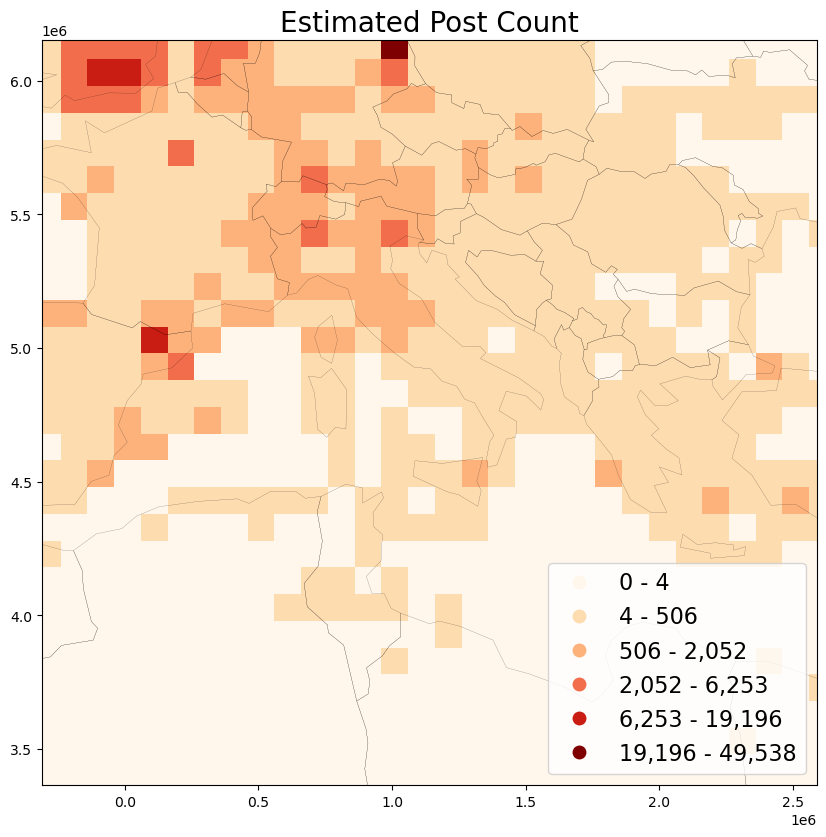

In [69]:
save_plot(
    grid=grid, title='Estimated Post Count',
    column='postcount_est', save_fig=f'postcount_sample_est.png')

**Note:** the data anomaly seen in Germany is located in the grid cell for Berlin. It is related to a single user who uploaded 53961 photos with sunset and sunrise. This anomaly will disappear once aggregation is based on user_guid count.

## B: Estimated User Count per grid

When using HLL, aggregation of user_guids or user_days takes the same amount of time (unlike when working with original data, where memory consumption increases significantly). We'll only need to update the columns that are loaded from the database:

In [70]:
usecols = ['latitude', 'longitude', 'user_hll']

Adjust method for stream-reading from CSV in chunks:

In [71]:
iter_csv = pd.read_csv(
    SUNSET_FLICKR, usecols=usecols, iterator=True,
    dtype=dtypes, encoding='utf-8', chunksize=CHUNK_SIZE)

In [72]:
def proj_report(df, cnt, inplace: bool = False):
    """Project df with progress report"""
    proj_df(df)
    clear_output(wait=True)
    print(f'Projected {cnt:,.0f} coordinates')
    if inplace:
        return
    return df

In [73]:
%%time
# filter
chunked_df = [
    filter_df_bbox( 
        df=chunk_df, bbox=bbox_italy_buf, inplace=False)
    for chunk_df in iter_csv]

# project
projected_cnt = 0
for chunk_df in chunked_df:
    projected_cnt += len(chunk_df)
    proj_report(
        chunk_df, projected_cnt, inplace=True)

display(chunked_df[0].head())

Projected 437,307 coordinates


,user_hll,x,y
0,\x138b40ee81,0.0,3.466077e+06
1,\x138b407741,0.0,3.971340e+06
2,\x138b402201,0.0,4.083858e+06
3,\x138b401a62,0.0,4.111792e+06
4,\x138b402543,0.0,4.140440e+06


CPU times: user 800 ms, sys: 15.8 ms, total: 816 ms
Wall time: 815 ms


### Perform the bin assignment and estimate distinct users

In [74]:
def bin_coordinates(
        df: pd.DataFrame, xbins:
        np.ndarray, ybins: np.ndarray) -> pd.DataFrame:
    """Bin coordinates using binary search and append to df as new index"""
    xbins_match, ybins_match = get_best_bins(
        search_values_x=df['x'].to_numpy(),
        search_values_y=df['y'].to_numpy(),
        xbins=xbins, ybins=ybins)
    # append target bins to original dataframe
    # use .loc to avoid chained indexing
    df.loc[:, 'xbins_match'] = xbins_match
    df.loc[:, 'ybins_match'] = ybins_match
    # drop x and y columns not needed anymore
    df.drop(columns=['x', 'y'], inplace=True)

In [75]:
def bin_chunked_coordinates(
    chunked_df: List[pd.DataFrame]):
    """Bin coordinates of chunked dataframe"""
    binned_cnt = 0
    for ix, df in enumerate(chunked_df):
        bin_coordinates(df, xbins, ybins)
        df.set_index(['xbins_match', 'ybins_match'], inplace=True)
        clear_output(wait=True)
        binned_cnt += len(df)
        print(f"Binned {binned_cnt:,.0f} coordinates..")

In [76]:
%%time
bin_chunked_coordinates(chunked_df)
display(chunked_df[0].head())

Binned 437,307 coordinates..


user_hll
xbins_match ybins_match              
-40096      3479952      \x138b40ee81
            3979952      \x138b407741
            4179952      \x138b402201
            4179952      \x138b401a62
            4179952      \x138b402543

CPU times: user 59.9 ms, sys: 0 ns, total: 59.9 ms
Wall time: 59.1 ms


Union HLL Sets per grid-id and calculate cardinality (estimated distinct user count):

In [77]:
join_chunkeddf_grid(
    chunked_df=chunked_df, grid=grid, metric="usercount_est")

Mapped ~5000000 coordinates to bins


In [78]:
grid[grid["usercount_est"]> 0].head()

geometry  \
xbin    ybin                                                                                                                                               
-340096 6179952  POLYGON ((-340096.000 6179952.000, -240096.000 6179952.000, -240096.000 6079952.000, -340096.000 6079952.000, -340096.000 6179952.000))   
        6079952  POLYGON ((-340096.000 6079952.000, -240096.000 6079952.000, -240096.000 5979952.000, -340096.000 5979952.000, -340096.000 6079952.000))   
        5979952  POLYGON ((-340096.000 5979952.000, -240096.000 5979952.000, -240096.000 5879952.000, -340096.000 5879952.000, -340096.000 5979952.000))   
        5879952  POLYGON ((-340096.000 5879952.000, -240096.000 5879952.000, -240096.000 5779952.000, -340096.000 5779952.000, -340096.000 5879952.000))   
        5779952  POLYGON ((-340096.000 5779952.000, -240096.000 5779952.000, -240096.000 5679952.000, -340096.000 5679952.000, -340096.000 5779952.000))   

                 postcount_est  usercount_est  
xbin    ybin                                   
-340096 6179952             15             13  
        6079952            294            260  
        5979952            194            110  
        5879952              1              2  
        5779952             18             51

Look at this. There're many polygons were thounsands of photos have been created by only few users. Lets see how this affects our test map..

### Preview user count map

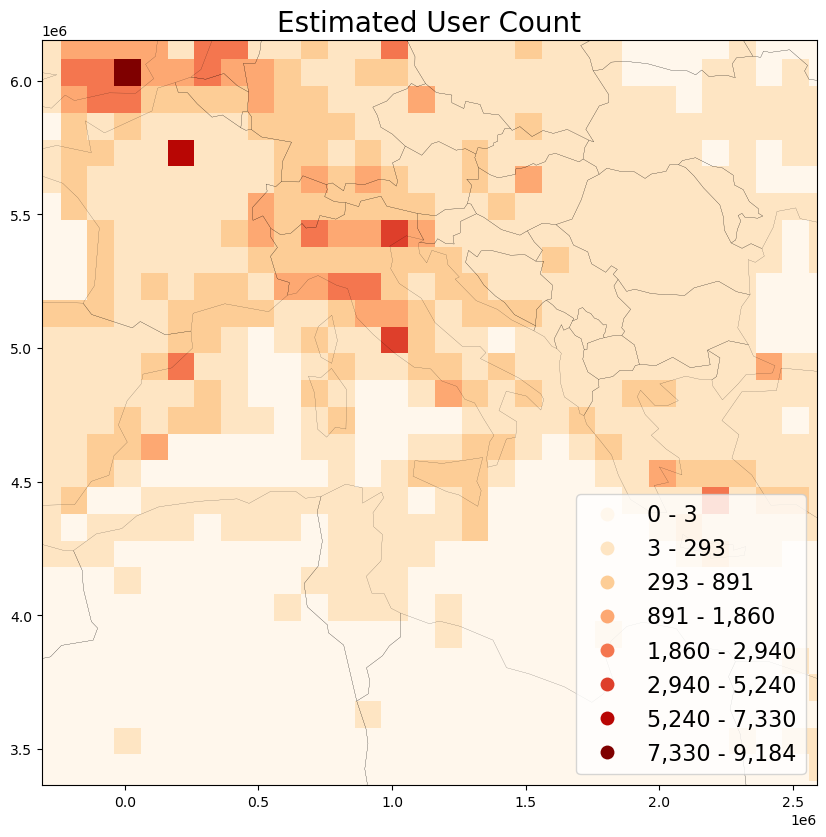

In [79]:
save_plot(
    grid=grid, title='Estimated User Count',
    column='usercount_est', save_fig='usercount_sample_est.png')

## C: Estimated User Days

<div class="alert alert-success">
    
Usually, due to the <a href="https://en.wikipedia.org/wiki/Count-distinct_problem">Count Distinct Problem</a> increasing computation times will apply for more complex distinct queries. This is not the case when using HLL. Any count distinct (postcount, usercount etc.) requires the same amount of time. A useful metric introduced by Wood et al. (2013) is User Days, which lies inbetween Post Count and User Count because Users may be counted more than once if they visited the location on consecutive days. User Days particularly allows capturing the difference between local and tourist behaviour patterns. The rationale here is that locals visit few places very often. In contrast, tourists visit many places only once.
    
</div>

The sequence of commands for userdays is exactly the same as for postcount and usercount above.

In [80]:
usecols = ['latitude', 'longitude', 'date_hll']

In [81]:
def read_project_chunked(filename: str,
    usecols: List[str], chunk_size: int = CHUNK_SIZE,
    bbox: Tuple[float, float, float, float] = None) -> List[pd.DataFrame]:
    """Read data from csv, optionally clip to bbox and projet"""
    iter_csv = pd.read_csv(
        filename, usecols=usecols, iterator=True,
        dtype=dtypes, encoding='utf-8', chunksize=chunk_size)
    if bbox:
        chunked_df = [filter_df_bbox( 
            df=chunk_df, bbox=bbox, inplace=False)
        for chunk_df in iter_csv]
    else:
        chunked_df = [chunk_df for chunk_df in iter_csv]
    # project
    projected_cnt = 0
    for chunk_df in chunked_df:
        projected_cnt += len(chunk_df)
        proj_report(
            chunk_df, projected_cnt, inplace=True)
    return chunked_df

Run:

In [82]:
%%time
chunked_df = read_project_chunked(
    filename=SUNRISE_FLICKR,
    usecols=usecols,
    bbox=bbox_italy_buf)
display(chunked_df[0].head())

Projected 129,019 coordinates


,date_hll,x,y
0,\x128b7f7cb07785dfbb61f2,0.0,3.615396e+06
1,\x128b7f50bb6537d599e830,0.0,3.933128e+06
2,\x128b7f45e4e5defa352a7d,0.0,4.020182e+06
3,\x128b7f9eeef6a04f7db999,0.0,4.142444e+06
4,\x128b7f044107045c4be6d6,0.0,4.552895e+06


CPU times: user 643 ms, sys: 24.6 ms, total: 668 ms
Wall time: 669 ms


In [83]:
%%time
bin_chunked_coordinates(chunked_df)

Binned 129,019 coordinates..
CPU times: user 23.5 ms, sys: 0 ns, total: 23.5 ms
Wall time: 20.5 ms


In [84]:
join_chunkeddf_grid(
    chunked_df=chunked_df, grid=grid, metric="userdays_est")

Mapped ~5000000 coordinates to bins


In [85]:
grid[grid["userdays_est"]> 0].head()

geometry  \
xbin    ybin                                                                                                                                               
-340096 6179952  POLYGON ((-340096.000 6179952.000, -240096.000 6179952.000, -240096.000 6079952.000, -340096.000 6079952.000, -340096.000 6179952.000))   
        6079952  POLYGON ((-340096.000 6079952.000, -240096.000 6079952.000, -240096.000 5979952.000, -340096.000 5979952.000, -340096.000 6079952.000))   
        5979952  POLYGON ((-340096.000 5979952.000, -240096.000 5979952.000, -240096.000 5879952.000, -340096.000 5879952.000, -340096.000 5979952.000))   
        5879952  POLYGON ((-340096.000 5879952.000, -240096.000 5879952.000, -240096.000 5779952.000, -340096.000 5779952.000, -340096.000 5879952.000))   
        5779952  POLYGON ((-340096.000 5779952.000, -240096.000 5779952.000, -240096.000 5679952.000, -340096.000 5679952.000, -340096.000 5779952.000))   

                 postcount_est  usercount_est  userdays_est  
xbin    ybin                                                 
-340096 6179952             15             13            15  
        6079952            294            260           293  
        5979952            194            110           183  
        5879952              1              2             1  
        5779952             18             51            18

Note below that our very active Berlin user doesn't affect the map as strong as with postcount. Of all three metrics, userdays per grid perhaps provides the most balanced capture of behaviour patterns.

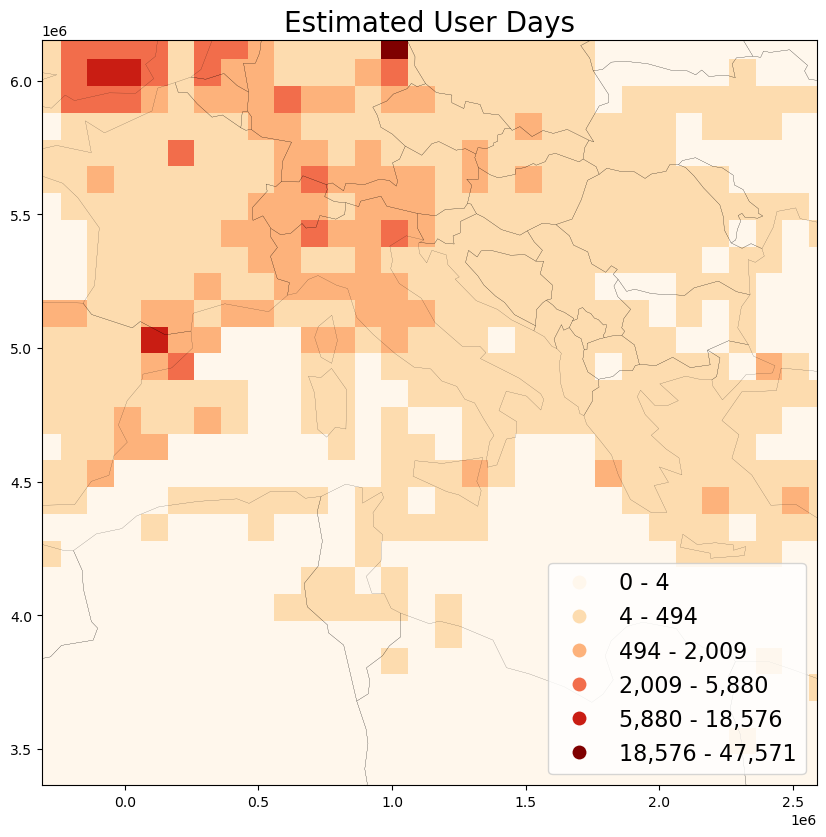

In [86]:
save_plot(
    grid=grid, title='Estimated User Days',
    column='userdays_est', save_fig='userdays_sample_est.png')

There're other approaches for further reducing noise. For example, to reduce the impact of automatic capturing devices (such as webcams uploading x pictures per day), a possibility is to count distinct **userlocations**. For userlocations metric, a user would be counted multiple times per grid bin only for pictures with different lat/lng. Or the number of distinct **userlocationdays** (etc.). These metrics easy to implement using hll, but would be quite difficult to compute using raw data.

# Prepare methods

Lets summarize the above code in a few methods:

**Plotting preparation**

The below methods contain combined code from above, plus final plot style improvements.

In [87]:
def format_legend(
    leg, bounds: List[str], inverse: bool = None,
    metric: str = "postcount_est"):
    """Formats legend (numbers rounded, colors etc.)"""
    leg.set_bbox_to_anchor((0., 0.3, 0.2, 0.3))
    # get all the legend labels
    legend_labels = leg.get_texts()
    plt.setp(legend_labels, fontsize='12')
    lcolor = 'black'
    if inverse:
        frame = leg.get_frame()
        frame.set_facecolor('black')
        frame.set_edgecolor('grey')
        lcolor = "white"
    plt.setp(legend_labels, color = lcolor)
    if metric == "postcount_est":
        leg.set_title("Estimated Post Count")
    elif metric == "usercount_est":
        leg.set_title("Estimated User Count")
    else:
        leg.set_title("Estimated User Days")
    plt.setp(leg.get_title(), fontsize='12')
    leg.get_title().set_color(lcolor)
    # replace the numerical legend labels
    for bound, legend_label in zip(bounds, legend_labels):
        legend_label.set_text(bound)

Label plotting

In [88]:
def _rnd_f(f: float, dec: int = None) -> str:
    if dec is None:
        # return f'{f}'
        dec = 0
    return f'{f:,.{dec}f}'

def format_bound(
    upper_bound: float = None, lower_bound: float = None, 
    decimals: Optional[int] = None) -> str:
    """Format legend text for class bounds"""
    if upper_bound is None:
        return _rnd_f(lower_bound, decimals)
    if lower_bound is None:
        return _rnd_f(upper_bound, decimals)
    return f'{_rnd_f(lower_bound, decimals)} - {_rnd_f(upper_bound, decimals)}'

def min_decimals(num1: float, num2: float) -> int:
    """Return number of minimum required decimals"""
    if _rnd_f(num1) != _rnd_f(num2):
        return 0
    for i in range(1, 5):
        if _rnd_f(num1, i) != _rnd_f(num2, i):
            return i
    return 5
        
def get_label_bounds(
    scheme_classes: np.ndarray, metric_series: pd.Series,
    flat: bool = None) -> List[str]:
    """Get all upper bounds in the scheme_classes category"""
    upper_bounds = scheme_classes
    # get and format all bounds
    bounds = []
    for idx, upper_bound in enumerate(upper_bounds):
        if idx == 0:
            lower_bound = metric_series.min()
            decimals = None
        else:
            decimals = min_decimals(
                upper_bounds[idx-1], upper_bounds[idx])
            lower_bound = upper_bounds[idx-1]
        if flat:
            bound = format_bound(
                lower_bound=lower_bound,
                decimals=decimals)
        else:
            bound = format_bound(
                upper_bound, lower_bound,
                decimals=decimals)
        bounds.append(bound)
    if flat:
        upper_bound = format_bound(
            upper_bound=upper_bounds[-1],
            decimals=decimals)
        bounds.append(upper_bound)
    return bounds

Classify & plotting

In [89]:
def label_nodata(
    grid: gp.GeoDataFrame, inverse: bool = None,
    metric: str = "postcount_est"):
    """Add white to a colormap to represent missing value
    
    Adapted from:
        https://stackoverflow.com/a/58160985/4556479
        
    See available colormaps:
        http://holoviews.org/user_guide/Colormaps.html
    """
    # set 0 to NaN
    grid_nan = grid[metric].replace(0, np.nan)
    # get headtail_breaks
    # excluding NaN values
    headtail_breaks = mc.HeadTailBreaks(
        grid_nan.dropna())
    grid[f'{metric}_cat'] = headtail_breaks.find_bin(
        grid_nan).astype('str')
    # set label for NaN values
    grid.loc[grid_nan.isnull(), f'{metric}_cat'] = 'No Data'
    bounds = get_label_bounds(
        headtail_breaks.bins, grid_nan.dropna().values)
    cmap_name = 'OrRd'
    nodata_color = 'white'
    if inverse:
        nodata_color = 'black'
        cmap_name = 'cet_fire'
    cmap = plt.cm.get_cmap(cmap_name, headtail_breaks.k)
    # get hex values
    cmap_list = [colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
    # lighten or darken up first/last color a bit 
    # to offset from black or white background
    if inverse:
        firstcolor = '#3E0100'
        cmap_list[0] = firstcolor
    else:
        lastcolor = '#440402'
        cmap_list.append(lastcolor)
        cmap_list.pop(0)
    # append nodata color
    cmap_list.append(nodata_color)
    cmap_with_nodata = colors.ListedColormap(cmap_list)
    return cmap_with_nodata, bounds

def plot_figure(
    grid: gp.GeoDataFrame, title: str, inverse: bool = None,
    metric: str = "postcount_est", store_fig: str = None,
    output: Path = OUTPUT):
    """Combine layers and plot"""
    # for plotting, there're some minor changes applied
    # to the dataframe (replace NaN values),
    # make a shallow copy here to prevent changes
    # to modify the original grid
    grid_plot = grid.copy()
    # create new plot figure object with one axis
    fig, ax = plt.subplots(1, 1, figsize=(22,28))
    ax.set_title(title, fontsize=16)
    print("Classifying bins..")
    cmap_with_nodata, bounds = label_nodata(
        grid=grid_plot, inverse=inverse, metric=metric)
    base = grid_plot.plot(
        ax=ax,
        column=f'{metric}_cat', cmap=cmap_with_nodata, legend=True)
    print("Formatting legend..")
    leg = ax.get_legend()
    format_legend(leg, bounds, inverse, metric)
    # combine with world geometry
    edgecolor = 'black'
    ax.set_facecolor('white')
    if inverse:
        edgecolor = 'white'
        ax.set_facecolor('black')
    plot = world.plot(
        ax=base, color='none', edgecolor=edgecolor, linewidth=0.1)
    if store_fig:
        print("Storing figure as png..")
        if inverse:
            store_fig = store_fig.replace('.png', '_inverse.png')
        fig.savefig(
            output / f"figures{km_size_str}" / store_fig, dpi=300, format='PNG',
            bbox_inches='tight', pad_inches=1)

Add specific method to filter Null Island from dataframe

In [90]:
def filter_nullisland_df(
    df: Optional[pd.DataFrame] = None, df_list: Optional[List[pd.DataFrame]] = None,
    col_x: str = "longitude", col_y: str = "latitude"):
    """Remove records from df inplace where both x and y coordinate are 0"""
    if df is not None:
        df_list = [df]
    if not df_list:
        raise ValueError("Please provide either df or df_list")
    for df in df_list:
        if col_x in df.columns:
            df.query(
                f'({col_x} == 0 and {col_y} == 0) == False',
                inplace=True)

High level plotting function

In [91]:
def load_plot(
    data: Path, grid: gp.GeoDataFrame, title: Optional[str] = "", inverse: Optional[bool] = None,
    filter_null_island: bool = None, 
    metric: str = "postcount_est", store_fig: str = None, store_pickle: str = None,
    chunk_size: int = CHUNK_SIZE, keep_hll: Optional[bool] = None,
    store_benchmark_data: Optional[bool] = None,
    data_list: List[Path] = None, plot: Optional[bool] = True,
    column_metric_ref: Dict[str, str] = COLUMN_METRIC_REF,
    reset_benchmark_data: Optional[bool] = None):
    """Load data, bin coordinates, estimate distinct counts (cardinality) and plot map
    
        Args:
        data: Path to read input CSV
        grid: A geopandas geodataframe with indexes x and y 
            (projected coordinates) and grid polys
        title: Title of the plot
        inverse: If True, inverse colors (black instead of white map)
        metric: target column for aggregate. Default: postcount_est.
        store_fig: Provide a name to store figure as PNG. Will append 
            '_inverse.png' if inverse=True.
        store_pickle: Provide a name to store pickled dataframe
            with aggregate counts to disk
        chunk_size: chunk processing into x records per chunk
        keep_hll: If True, hll sets will not be removed 
            after final estimation of cardinality
        store_benchmark_data: If True, hll data will be stored to separate
            output pickle file, ending with _hll.pkl
        data_list: Optionally provide a list of data paths that will be combined.
        plot: Plot & store figure (Default = True).
        reset_benchmark_data: Optionally remove/reset hll data from previous run.
    """
    if store_benchmark_data is None:
        benchmark_data = False
    if reset_benchmark_data is None:
        reset_benchmark_data = True
    if store_benchmark_data:
        keep_hll = True
    if inverse is None:
        inverse = False
    if filter_null_island is None:
        filter_null_island = True
    if reset_benchmark_data:
        hll_col = metric.replace("_est", "_hll")
        grid.drop(columns=[hll_col], inplace=True, errors='ignore')
    usecols = ['latitude', 'longitude']
    column = column_metric_ref.get(metric)
    usecols.append(column)
    # get data from csv
    chunked_df = read_project_chunked(
        filename=data,
        usecols=usecols)
     # optionally filter null island
    if filter_null_island:
        filter_nullisland_df(df_list=chunked_df)
    # bin coordinates
    bin_chunked_coordinates(chunked_df)
    # reset metric column
    reset_metrics(grid, [metric], setzero=False)
    print("Getting cardinality per bin..")
    # union hll sets per chunk and 
    # calculate distinct counts on last iteration
    join_chunkeddf_grid(
        chunked_df=chunked_df, grid=grid,
        metric=metric, chunk_size=chunk_size,
        keep_hll=keep_hll)
    # store intermediate data
    if store_pickle:
        print("Storing aggregate data as pickle..")
        grid.to_pickle(OUTPUT / f"pickles{km_size_str}" / f"{store_pickle}.pkl")
    if store_benchmark_data:
        print("Storing benchmark hll data as pickle..")
        grid[[metric.replace("_est", "_hll"), "geometry"]].to_pickle(
            OUTPUT / f"pickles{km_size_str}" / f"{store_pickle}_hll.pkl")
    if plot:
        print("Plotting figure..")
        plot_figure(grid, title, inverse, metric, store_fig)

#  Plotting worldmaps: Post Count

Plot worldmap for each datasource

In [92]:
reset_metrics(grid)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19.4 s, sys: 804 ms, total: 20.2 s
Wall time: 42.8 s


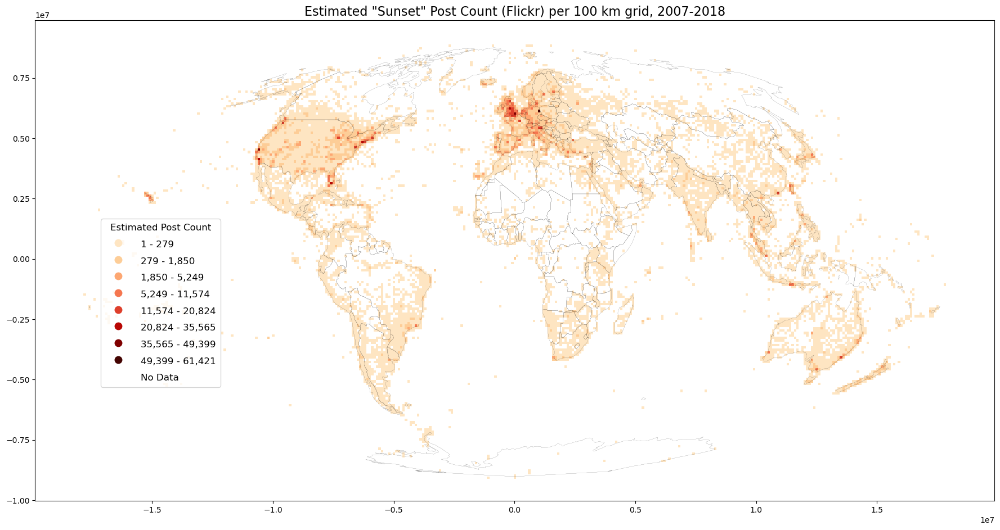

In [93]:
%%time
load_plot(
    SUNSET_FLICKR, grid, title=f'Estimated "Sunset" Post Count (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_postcount_sunset_est.png", store_pickle="flickr_postcount_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 15.9 s, sys: 487 ms, total: 16.4 s
Wall time: 21.9 s


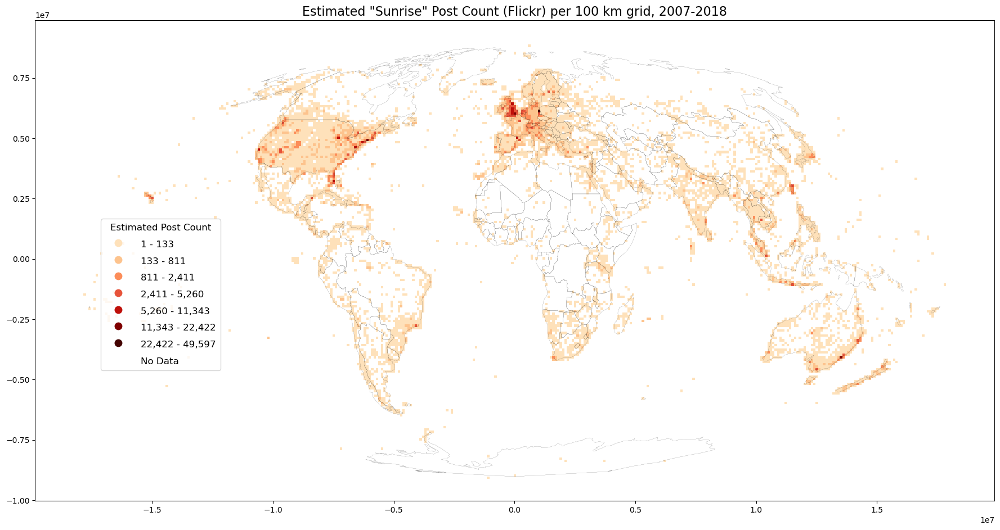

In [94]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_FLICKR, grid, title=f'Estimated "Sunrise" Post Count (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_postcount_sunrise_est.png", store_pickle="flickr_postcount_sunrise_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.2 s, sys: 557 ms, total: 17.7 s
Wall time: 27.5 s


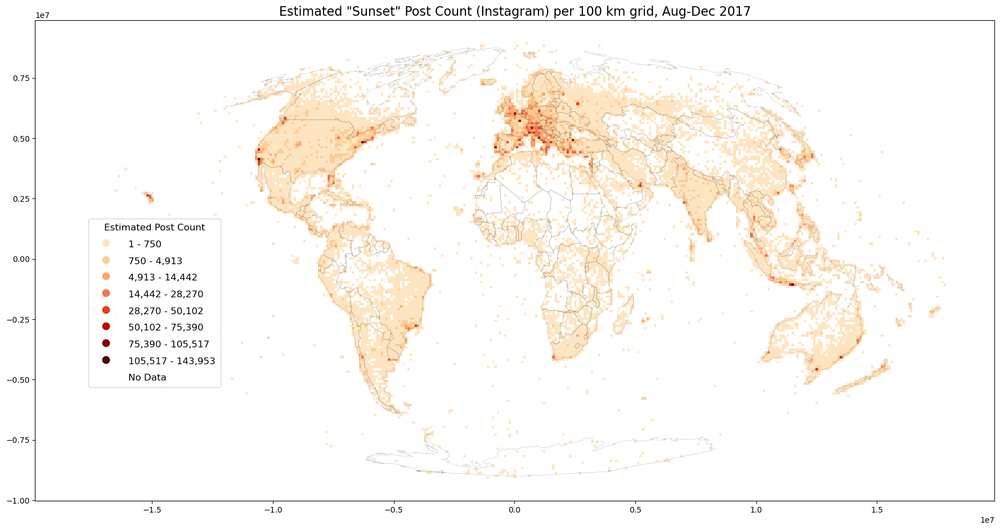

In [95]:
%%time
reset_metrics(grid)
load_plot(
    SUNSET_INSTAGRAM, grid, title=f'Estimated "Sunset" Post Count (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_postcount_sunset_est.png", store_pickle="instagram_postcount_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 15.2 s, sys: 471 ms, total: 15.7 s
Wall time: 20.1 s


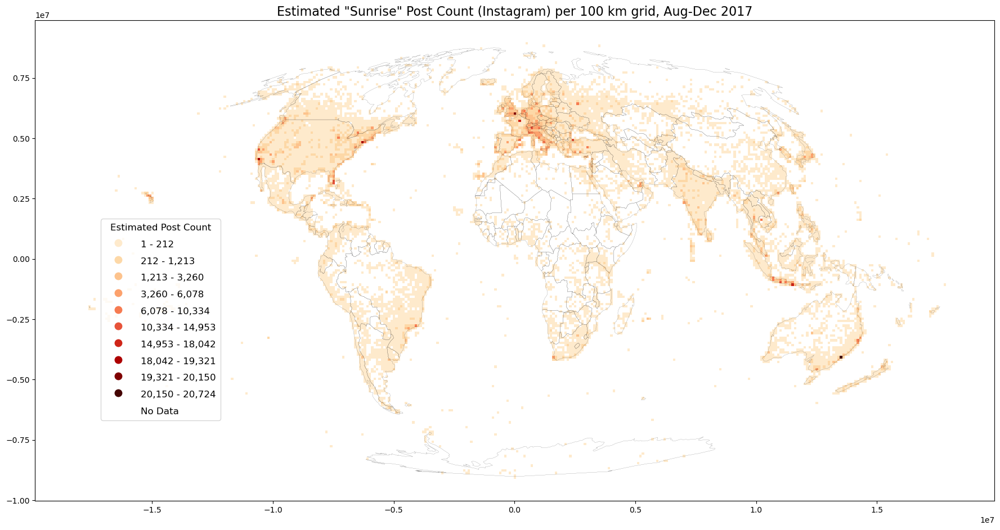

In [96]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_INSTAGRAM, grid, title=f'Estimated "Sunrise" Post Count (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_postcount_sunrise_est.png", store_pickle="instagram_postcount_sunrise_est", store_benchmark_data=True)

Mapped ~10000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 52.5 s, sys: 6.16 s, total: 58.7 s
Wall time: 2min 56s


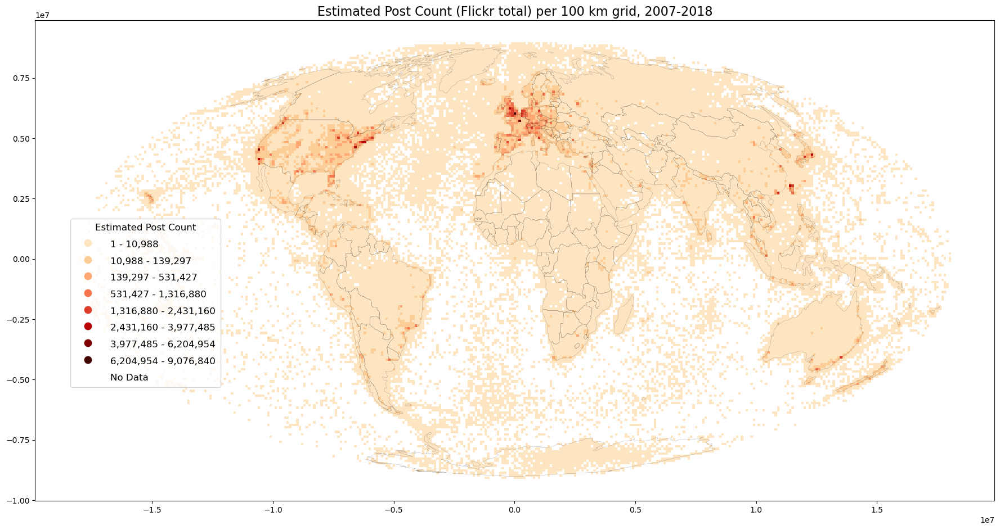

In [97]:
%%time
reset_metrics(grid)
load_plot(
    ALL_FLICKR, grid, title=f'Estimated Post Count (Flickr total) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_postcount_all_est.png", store_pickle="flickr_postcount_all_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.3 s, sys: 722 ms, total: 18.1 s
Wall time: 24.1 s


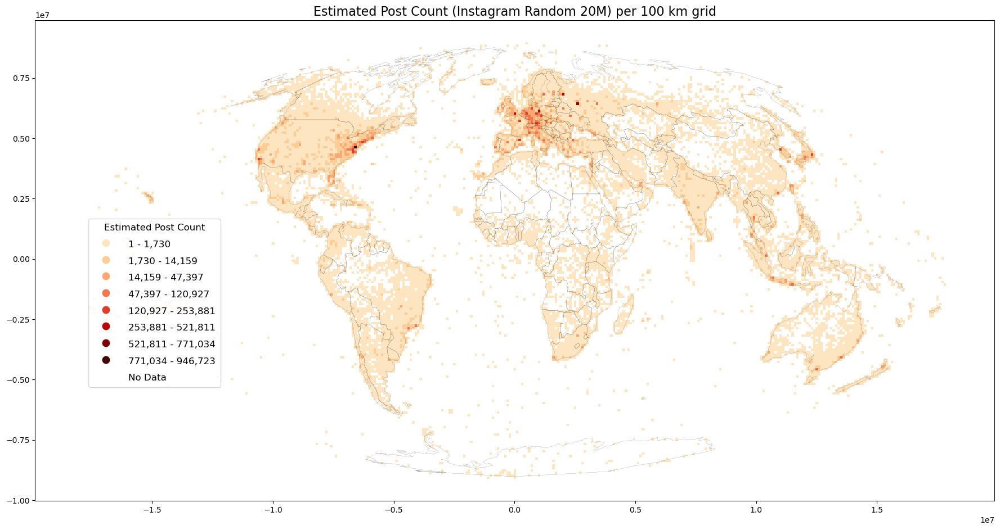

In [98]:
%%time
reset_metrics(grid)
load_plot(
    RANDOM_INSTAGRAM, grid, title=f'Estimated Post Count (Instagram Random 20M) per {km_size:.0f} km grid',
    store_fig="instagram_postcount_random_est.png", store_pickle="instagram_postcount_random_est", store_benchmark_data=True)

# Plotting worldmaps: User Count

In addition to the cardinality, for user count and user days, the hll sets itself are stored (`store_benchmark_data=True`)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19 s, sys: 604 ms, total: 19.6 s
Wall time: 41.6 s


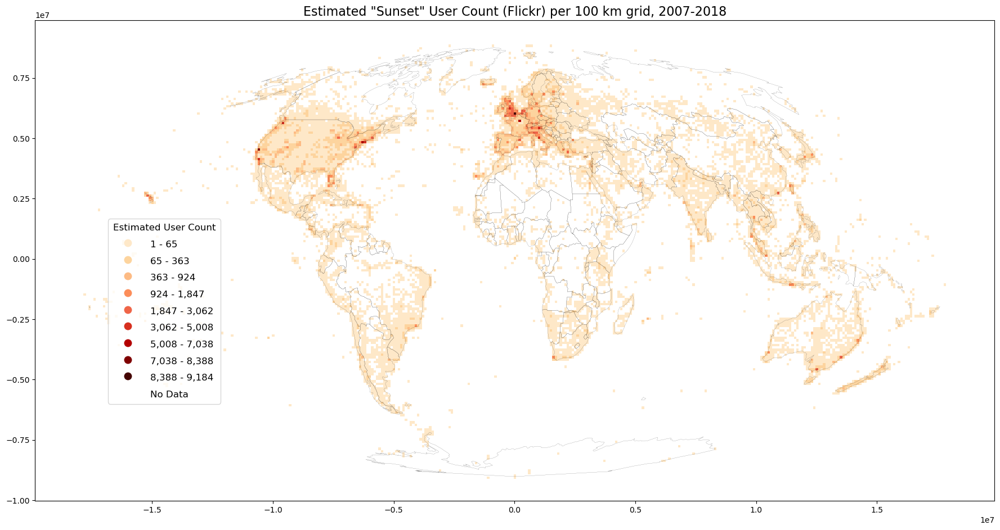

In [99]:
%%time
reset_metrics(grid)
load_plot(
    SUNSET_FLICKR, grid, title=f'Estimated "Sunset" User Count (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_usercount_sunset_est.png",
    metric="usercount_est", store_pickle="flickr_usercount_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 15.5 s, sys: 405 ms, total: 15.9 s
Wall time: 21 s


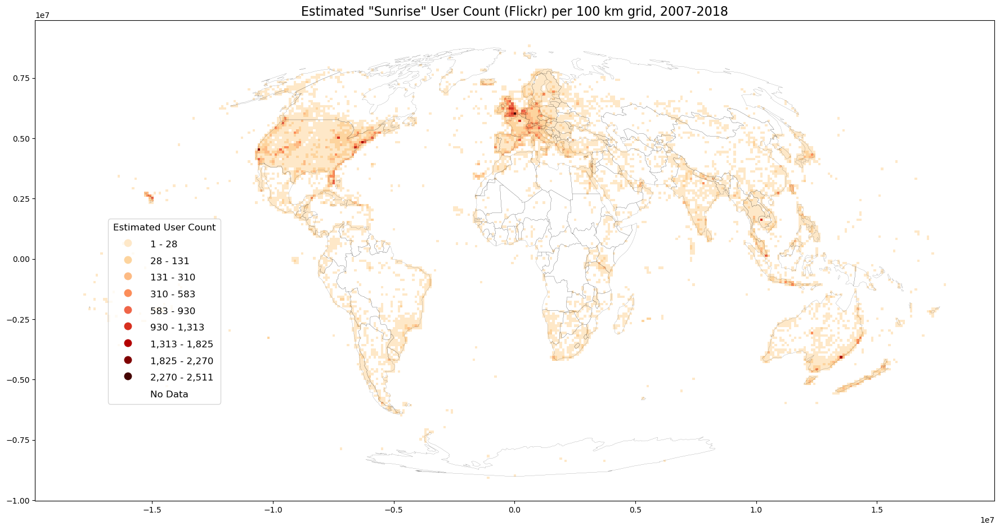

In [100]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_FLICKR, grid, title=f'Estimated "Sunrise" User Count (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_usercount_sunrise_est.png",
    metric="usercount_est", store_pickle="flickr_usercount_sunrise_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.2 s, sys: 548 ms, total: 17.7 s
Wall time: 27.9 s


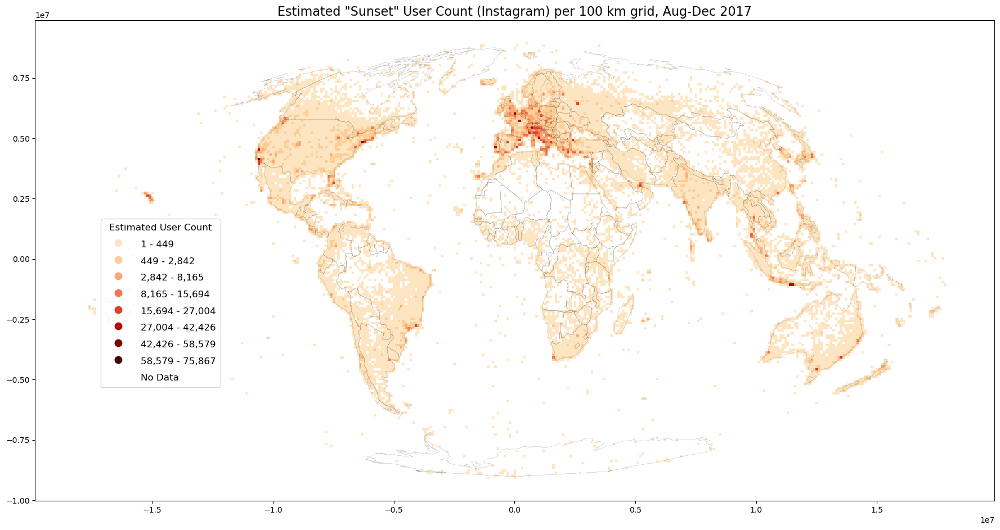

In [101]:
%%time
reset_metrics(grid)
load_plot(
    SUNSET_INSTAGRAM, grid, title=f'Estimated "Sunset" User Count (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_usercount_sunset_est.png",
    metric="usercount_est", store_pickle="instagram_usercount_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 15.4 s, sys: 378 ms, total: 15.8 s
Wall time: 20.4 s


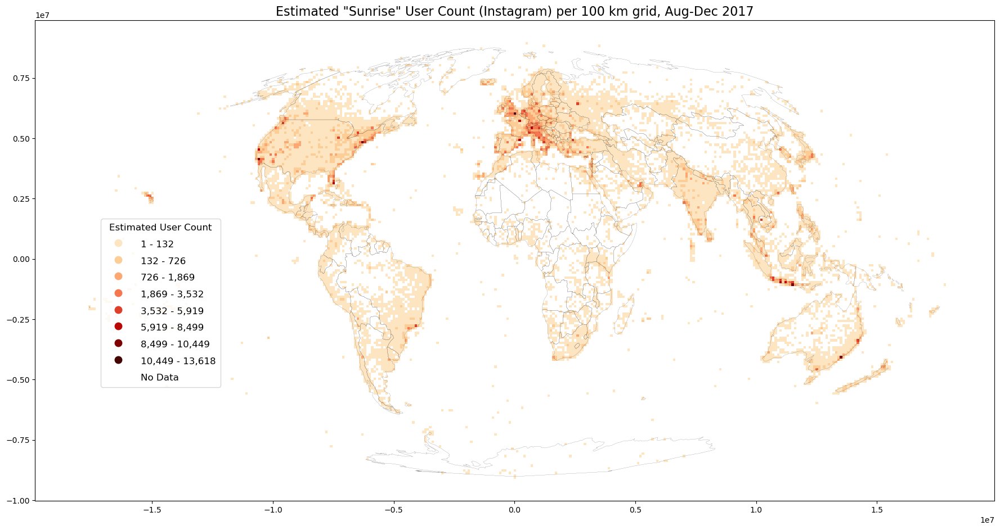

In [102]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_INSTAGRAM, grid, title=f'Estimated "Sunrise" User Count (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_usercount_sunrise_est.png",
    metric="usercount_est", store_pickle="instagram_usercount_sunrise_est",
    store_benchmark_data=True)

Mapped ~10000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 45.3 s, sys: 2.89 s, total: 48.2 s
Wall time: 2min 33s


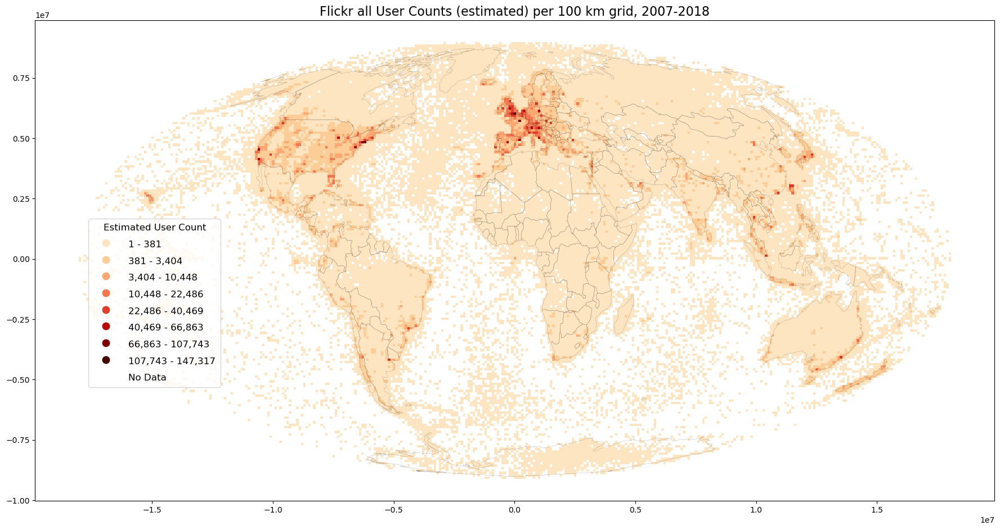

In [103]:
%%time
reset_metrics(grid)
load_plot(
    ALL_FLICKR, grid, f'Flickr all User Counts (estimated) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_usercount_all_est.png", metric="usercount_est", store_pickle="flickr_usercount_all_est",
    store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.3 s, sys: 361 ms, total: 17.7 s
Wall time: 23.7 s


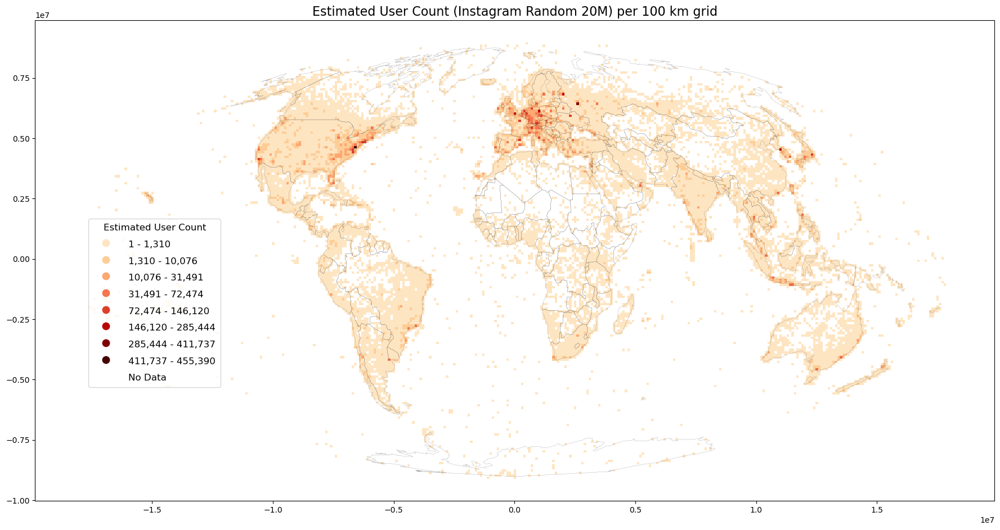

In [104]:
%%time
reset_metrics(grid)
load_plot(
    RANDOM_INSTAGRAM, grid, title=f'Estimated User Count (Instagram Random 20M) per {km_size:.0f} km grid',
    store_fig="instagram_usercount_random_est.png",
    metric="usercount_est", store_pickle="instagram_usercount_random_est",
    store_benchmark_data=True)

# Plotting worldmaps: User Days

For usercount, we'll also store the hll sets, to be able to later continue to aggregate data (country summaries).

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19.1 s, sys: 549 ms, total: 19.7 s
Wall time: 41.8 s


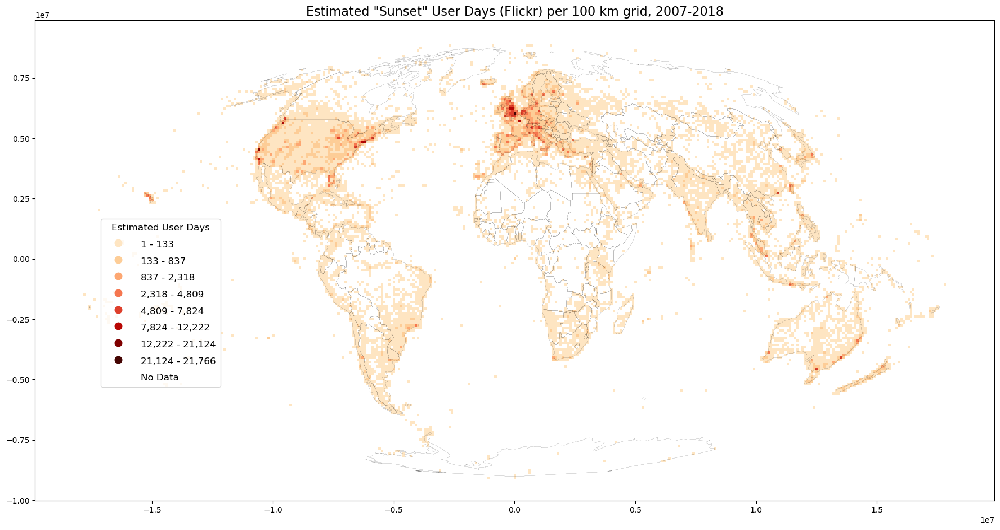

In [105]:
%%time
reset_metrics(grid)
load_plot(
    SUNSET_FLICKR, grid, title=f'Estimated "Sunset" User Days (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_userdays_sunset_est.png",
    metric="userdays_est", store_pickle="flickr_userdays_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 16.5 s, sys: 269 ms, total: 16.7 s
Wall time: 22.2 s


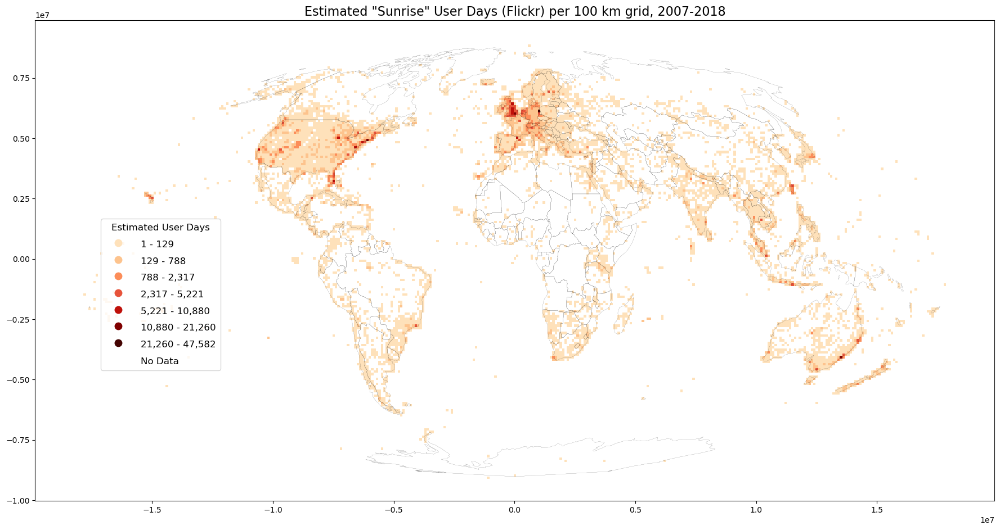

In [106]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_FLICKR, grid, title=f'Estimated "Sunrise" User Days (Flickr) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_userdays_sunrise_est.png",
    metric="userdays_est", store_pickle="flickr_userdays_sunrise_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.5 s, sys: 372 ms, total: 17.9 s
Wall time: 27.8 s


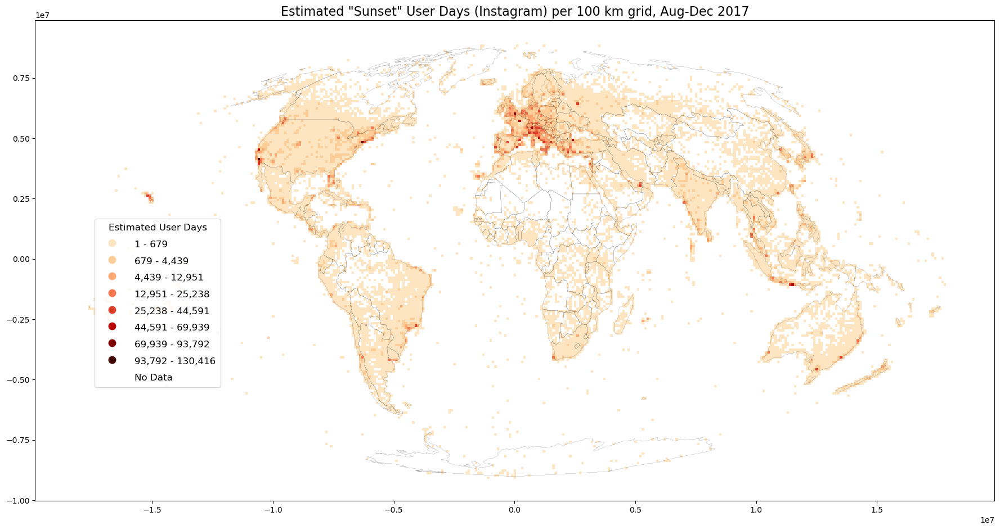

In [107]:
%%time
reset_metrics(grid)
load_plot(
    SUNSET_INSTAGRAM, grid, title=f'Estimated "Sunset" User Days (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_userdays_sunset_est.png",
    metric="userdays_est", store_pickle="instagram_userdays_sunset_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 15.1 s, sys: 276 ms, total: 15.4 s
Wall time: 19.9 s


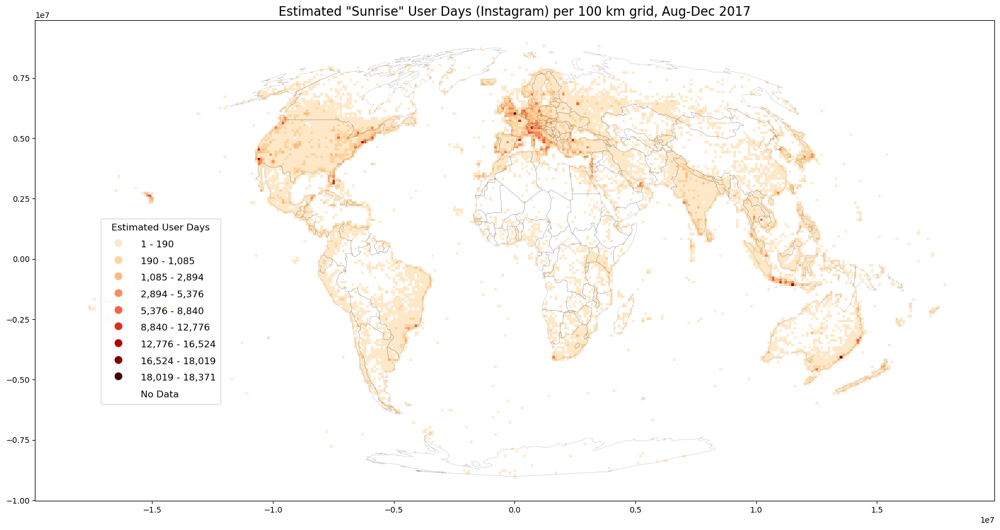

In [108]:
%%time
reset_metrics(grid)
load_plot(
    SUNRISE_INSTAGRAM, grid, title=f'Estimated "Sunrise" User Days (Instagram) per {km_size:.0f} km grid, Aug-Dec 2017',
    store_fig="instagram_userdays_sunrise_est.png",
    metric="userdays_est", store_pickle="instagram_userdays_sunrise_est", store_benchmark_data=True)

Mapped ~10000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 47.3 s, sys: 3.44 s, total: 50.8 s
Wall time: 2min 38s


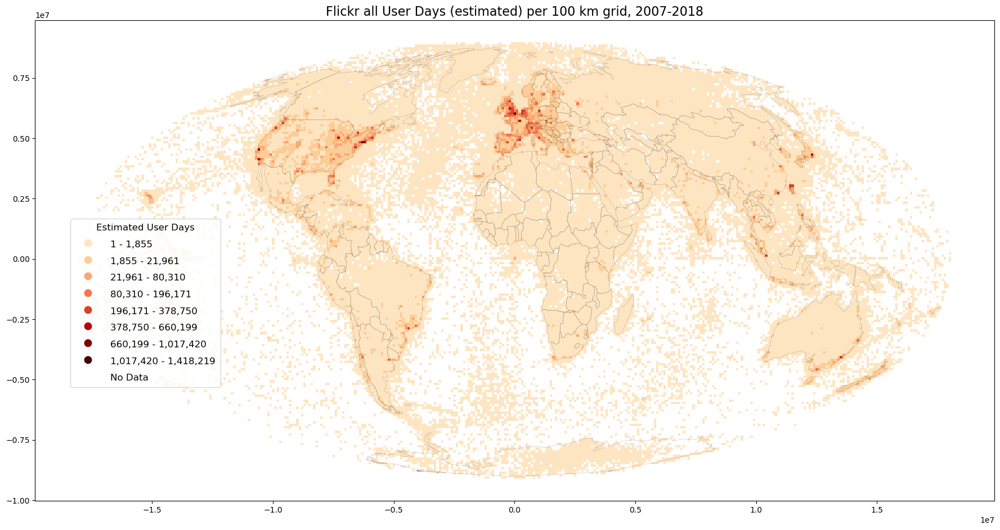

In [109]:
%%time
reset_metrics(grid)
load_plot(
    ALL_FLICKR, grid, title=f'Flickr all User Days (estimated) per {km_size:.0f} km grid, 2007-2018',
    store_fig="flickr_userdays_all_est.png", 
    metric="userdays_est", store_pickle="flickr_userdays_all_est", store_benchmark_data=True)

Mapped ~5000000 coordinates to bins
Storing aggregate data as pickle..
Storing benchmark hll data as pickle..
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 17.4 s, sys: 531 ms, total: 17.9 s
Wall time: 24.1 s


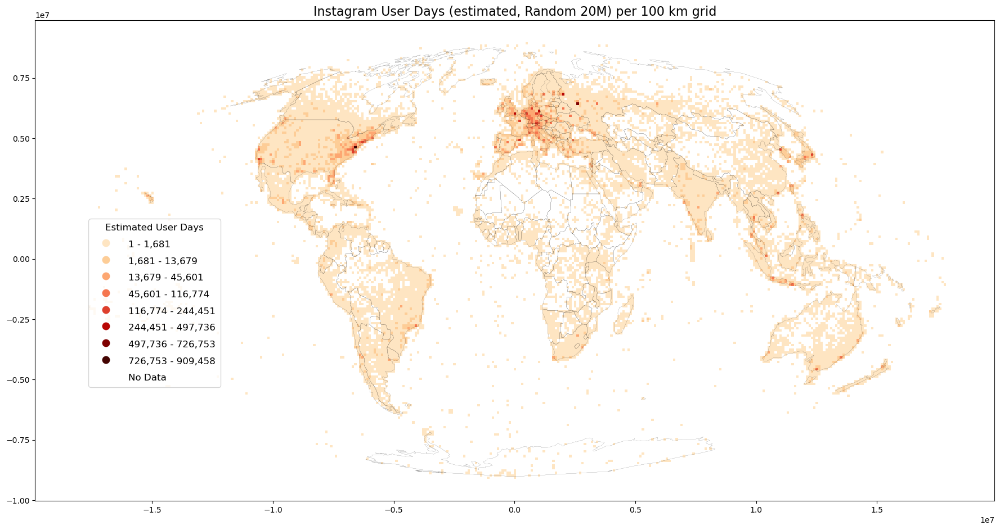

In [110]:
%%time
reset_metrics(grid)
load_plot(
    RANDOM_INSTAGRAM, grid, title=f'Instagram User Days (estimated, Random 20M) per {km_size:.0f} km grid',
    store_fig="instagram_userdays_random_est.png", 
    metric="userdays_est", store_pickle="instagram_userdays_random_est", store_benchmark_data=True)

## Merging Instagram Sunset and Sunrise data

For the Instagram chi calculation, we need a dataset with total number of users per bin. Given the volume of total number of photos shared on Instagram, this is quite difficult ([~50 billion pictures](https://www.wordstream.com/blog/ws/2017/04/20/instagram-statistics) shared to-date). As an alternative, we can combine both sunrise and sunset posts. Use the `load_plot()` function with `keep_hll` and create the plot only on second run.

In [111]:
def merge_instagram_sunsetsunrise(
        grid: gp.GeoDataFrame, metric: str,
        sunrise_instagram=SUNRISE_INSTAGRAM, sunset_instagram=SUNSET_INSTAGRAM,
        km_size_str=km_size_str):
    """Merge Instagram Sunset & Sunrise data as a replacement for Expected (All), store pickles"""
    # reset grid metrics
    reset_metrics(grid)
    load_plot(
        sunrise_instagram, grid, metric=metric, plot=False, keep_hll=True)
    
    # aggregate usercount per bin and store pickle
    load_plot(
        sunset_instagram, grid,
        title=(f'Estimated "Sunrise+Sunset" {metric.replace("_est", "").capitalize()} '
               f'(Instagram) per {km_size:.0f} km grid, Aug-Dec 2017'),
        store_fig=f"instagram_{metric.replace('_est', '')}_sunsetsunrise_est.png",
        metric=metric, keep_hll=True, reset_benchmark_data=False)
    
    # store benchmark data
    grid[metric.replace("_est", "_hll")].to_frame().to_pickle(
        OUTPUT / f"pickles{km_size_str}" / f"instagram_{metric.replace('_est', '')}_sunsetsunrise_est_hll.pkl")
    
    # drop hll column
    grid.drop(columns=[metric.replace("_est", "_hll")], inplace=True)
    # save to pickle
    grid.to_pickle(
        OUTPUT / f"pickles{km_size_str}" / f"instagram_{metric.replace('_est', '')}_sunsetsunrise_est.pkl")

Mapped ~5000000 coordinates to bins
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19.2 s, sys: 391 ms, total: 19.6 s
Wall time: 34.2 s


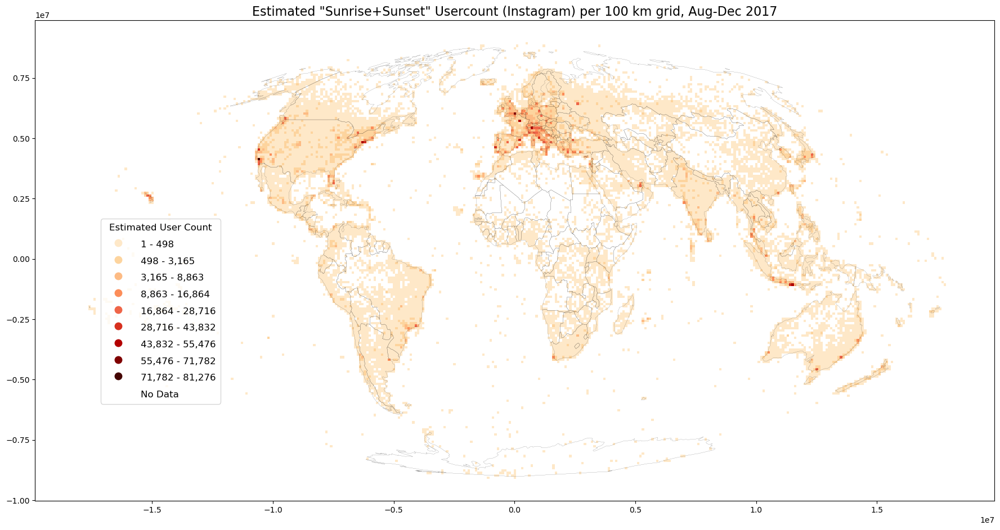

In [112]:
%%time
merge_instagram_sunsetsunrise(grid=grid, metric="usercount_est")

Mapped ~5000000 coordinates to bins
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19 s, sys: 404 ms, total: 19.4 s
Wall time: 34.1 s


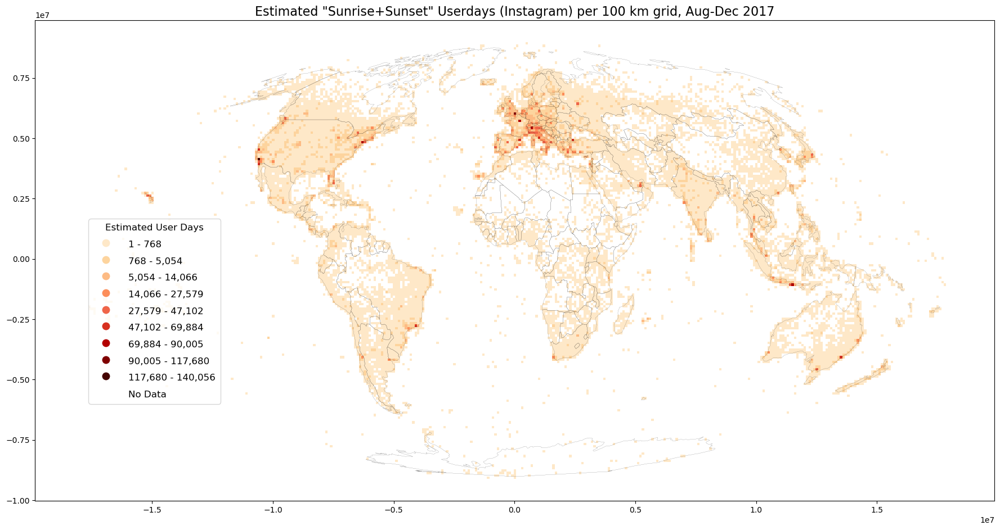

In [113]:
%%time
merge_instagram_sunsetsunrise(grid=grid, metric="userdays_est")

Mapped ~5000000 coordinates to bins
Plotting figure..
Classifying bins..
Formatting legend..
Storing figure as png..
CPU times: user 19.1 s, sys: 455 ms, total: 19.5 s
Wall time: 34.5 s


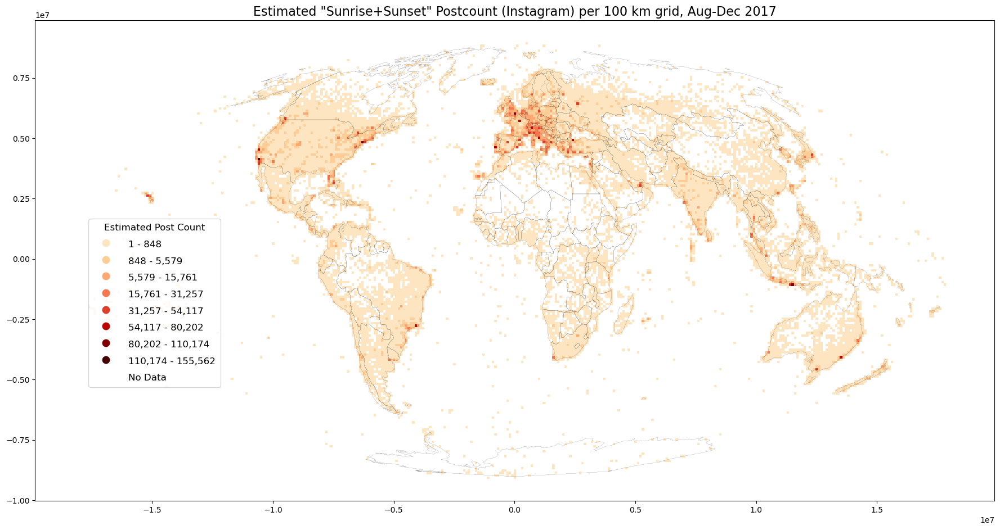

In [114]:
%%time
merge_instagram_sunsetsunrise(grid=grid, metric="postcount_est")

# Save & load intermediate data

## Load & plot pickled dataframe

Loading (geodataframe) using [pickle](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_pickle.html#pandas.read_pickle). This is the easiest way to store intermediate data, but may be incompatible [if package versions change](https://stackoverflow.com/questions/6687262/how-do-i-know-which-versions-of-pickle-a-particular-version-of-python-supports). If loading pickles does not work, a workaround is to load data from CSV and re-create pickle data, which will be compatible with used versions.

**Load pickled dataframe:**

In [115]:
%%time
grid = pd.read_pickle(OUTPUT / f"pickles{km_size_str}" / "flickr_postcount_all_est.pkl")

CPU times: user 280 ms, sys: 12 ms, total: 292 ms
Wall time: 291 ms


Then use `plot_figure` on dataframe to plot with new parameters, e.g. plot inverse:

Classifying bins..
Formatting legend..


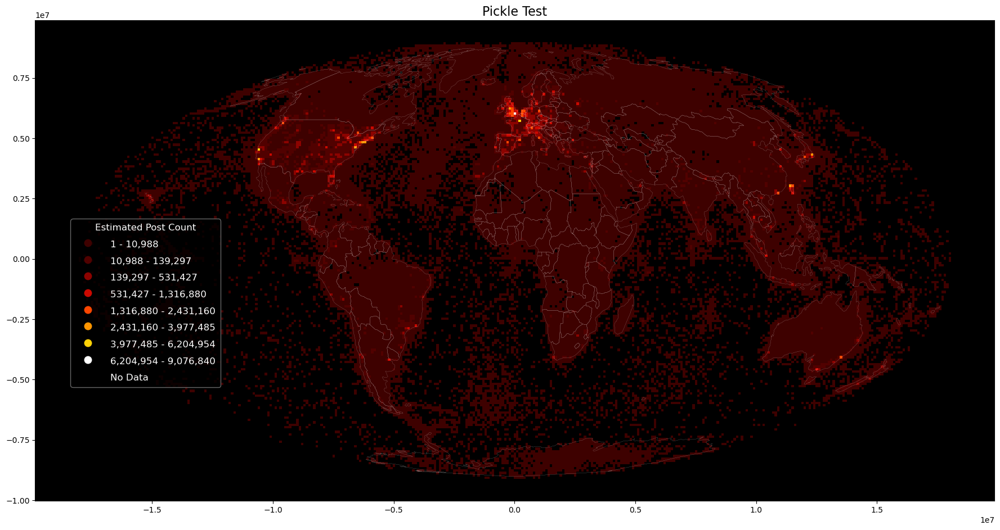

In [116]:
plot_figure(grid, "Pickle Test", inverse=True, metric="postcount_est")

**To merge results (e.g. postcount, usercount, userdays) of multiple pickles:**

In [117]:
pickles_path = OUTPUT / f"pickles{km_size_str}"
pickle_list_flickr = [
    pickles_path / "flickr_postcount_all_est.pkl",
    pickles_path / "flickr_usercount_all_est.pkl",
    pickles_path / "flickr_userdays_all_est.pkl"
]
pickle_list_instagram = [
    pickles_path / "instagram_postcount_random_est.pkl",
    pickles_path / "instagram_usercount_random_est.pkl",
    pickles_path / "instagram_userdays_random_est.pkl"
]
column_list = [
    "postcount_est",
    "usercount_est",
    "userdays_est"
]

In [118]:
def load_pickle_merge(pickle_list: List[Path], column_list: List[str]):
    """Load pickles and merge columns based on list"""
    grid_list = []
    for pickle_path in pickle_list:
        grid_list.append(pd.read_pickle(pickle_path))
    grid = grid_list[0]
    for ix in range(1, len(grid_list)):
        grid = grid.merge(
            grid_list[ix][[column_list[ix]]],
            left_index=True, right_index=True)
    return grid

In [119]:
grid = load_pickle_merge(pickle_list_flickr, column_list)

Have a look at the numbers for exact and estimated values. Smaller values are exact in both hll and raw because Sparse Mode is used.

In [120]:
grid[grid["usercount_est"]>5].drop(columns=["geometry"]).head()

postcount_hll  \
xbin      ybin                                                                                                                                                              
-18040096  79952                                                                                             \x138b40106112221fa136213b8440c14661536157826fe479a4ca21eca1   
-17640096 -2020048  \x148b4008c800084200c02088051040109021100620982010c443044108841184073040108422080e618c82004020880200820004221080010042004081802018c240040208405088...   
-17540096 -1720048  \x138b4000c401010165040204a305e1082108620a020a420b640c0310c310e415021582166216a11701176218e11a011ae31b021ca11e611ee11f62200221a322a123442762286229...   
          -2020048  \x138b40002200e101e10202028102e10302034103c1056405e1084108e2098109c20a410b610b840ba40bc20cc20d030d410d620d810da10ec20f4210641083110111421182122112...   
-17440096 -1620048  \x138b40006200a300e10102014301a302210261038104c304e10703076208010841088209c109e30a420b820be20c410d010d810de10e010ec10f4210641141116112a3130113c214...   

                    postcount_est  usercount_est  userdays_est  
xbin      ybin                                                  
-18040096  79952               13             11            12  
-17640096 -2020048           2366             93           314  
-17540096 -1720048            198              6            61  
          -2020048            499             19            54  
-17440096 -1620048            485             20           127

## Load & store results from and to CSV

To export only aggregate counts (postcount, usercount) to CSV (e.g. for archive purposes):

**Store results to CSV for archive purposes:**

Define method:

In [121]:
def grid_agg_tocsv(
    grid: gp.GeoDataFrame, filename: str,
    metrics: List[str] = ["postcount_est", "usercount_est", "userdays_est"]):
    """Store geodataframe aggregate columns and indexes to CSV"""
    grid.to_csv(OUTPUT / f"csv{km_size_str}" / filename, mode='w', columns=metrics, index=True)

Convert/store to CSV (aggregate columns and indexes only):

In [122]:
grid_agg_tocsv(grid, "flickr_all_est.csv")

Repeat for Instagram

In [123]:
grid = load_pickle_merge(pickle_list_instagram, column_list)

In [124]:
grid.head()

geometry  \
xbin      ybin                                                                                                                                                         
-18040096 8979952  POLYGON ((-18040096.000 8979952.000, -17940096.000 8979952.000, -17940096.000 8879952.000, -18040096.000 8879952.000, -18040096.000 8979952.000))   
          8879952  POLYGON ((-18040096.000 8879952.000, -17940096.000 8879952.000, -17940096.000 8779952.000, -18040096.000 8779952.000, -18040096.000 8879952.000))   
          8779952  POLYGON ((-18040096.000 8779952.000, -17940096.000 8779952.000, -17940096.000 8679952.000, -18040096.000 8679952.000, -18040096.000 8779952.000))   
          8679952  POLYGON ((-18040096.000 8679952.000, -17940096.000 8679952.000, -17940096.000 8579952.000, -18040096.000 8579952.000, -18040096.000 8679952.000))   
          8579952  POLYGON ((-18040096.000 8579952.000, -17940096.000 8579952.000, -17940096.000 8479952.000, -18040096.000 8479952.000, -18040096.000 8579952.000))   

                  postcount_hll  postcount_est  usercount_est  userdays_est  
xbin      ybin                                                               
-18040096 8979952           NaN              0              0             0  
          8879952           NaN              0              0             0  
          8779952           NaN              0              0             0  
          8679952           NaN              0              0             0  
          8579952           NaN              0              0             0

In [125]:
grid_agg_tocsv(grid, "instagram_random_est.csv")

In [126]:
def create_new_grid(
    grid_size: int = GRID_SIZE_METERS,
    proj_transformer: Transformer = PROJ_TRANSFORMER) -> gp.GeoDataFrame:
    """Create new 100x100km grid GeoDataFrame (Mollweide)"""
    # grid bounds from WGS1984 to Mollweide
    xmin = proj_transformer.transform(
        -180, 0)[0]
    xmax = proj_transformer.transform(
        180, 0)[0]
    ymax = proj_transformer.transform(
        0, 90)[1]
    ymin = proj_transformer.transform(
        0, -90)[1]
    grid = create_grid_df(
        grid_size=grid_size,
        xmin=xmin, ymin=ymin,
        xmax=xmax, ymax=ymax)
    # convert grid DataFrame to grid GeoDataFrame
    grid = grid_to_gdf(grid)
    return grid

def grid_agg_fromcsv(
    filename: str, columns: List[str] = ["xbin", "ybin"],
    metrics: List[str] = None, grid_size: int = GRID_SIZE_METERS):
    """Create a new Mollweide grid GeoDataFrame and 
    attach aggregate data columns from CSV based on index"""
    # 1. Create new 100x100km (e.g.) grid
    grid = create_new_grid(grid_size=grid_size)
    # 2. load aggregate data from CSV and attach to grid
    # -----
    if metrics is None:
        metrics = ["postcount_est", "usercount_est", "userdays_est"]
    types_dict = dict()
    for column in columns:
        if column.endswith('_hll'):
            types_dict[column] = str
    for metric in metrics:
        types_dict[metric] = int
    columns = columns + metrics
    # read only header first to check whether columns exist
    df = pd.read_csv(filename, usecols=columns, nrows=0)
    # remove columns if they do not exist in file
    columns[:] = [col for col in columns if col in (df.columns)]
    # load dataframe fully
    df = pd.read_csv(
        filename, dtype=types_dict,
        index_col=["xbin", "ybin"],
        usecols=columns)
    # join columns based on index
    grid = grid.join(df)
    # return grid with aggregate data attached
    return grid

To create a new grid and load aggregate counts from CSV:

In [127]:
grid = grid_agg_fromcsv(OUTPUT / f"csv{km_size_str}" / "flickr_all_est.csv")

In [128]:
grid[grid["usercount_est"]>5].head()

geometry  \
xbin      ybin                                                                                                                                                              
-18040096  79952                POLYGON ((-18040096.000 79952.000, -17940096.000 79952.000, -17940096.000 -20048.000, -18040096.000 -20048.000, -18040096.000 79952.000))   
-17640096 -2020048  POLYGON ((-17640096.000 -2020048.000, -17540096.000 -2020048.000, -17540096.000 -2120048.000, -17640096.000 -2120048.000, -17640096.000 -2020048.0...   
-17540096 -1720048  POLYGON ((-17540096.000 -1720048.000, -17440096.000 -1720048.000, -17440096.000 -1820048.000, -17540096.000 -1820048.000, -17540096.000 -1720048.0...   
          -2020048  POLYGON ((-17540096.000 -2020048.000, -17440096.000 -2020048.000, -17440096.000 -2120048.000, -17540096.000 -2120048.000, -17540096.000 -2020048.0...   
-17440096 -1620048  POLYGON ((-17440096.000 -1620048.000, -17340096.000 -1620048.000, -17340096.000 -1720048.000, -17440096.000 -1720048.000, -17440096.000 -1620048.0...   

                    postcount_est  usercount_est  userdays_est  
xbin      ybin                                                  
-18040096  79952               13             11            12  
-17640096 -2020048           2366             93           314  
-17540096 -1720048            198              6            61  
          -2020048            499             19            54  
-17440096 -1620048            485             20           127

**Store all other pickles as combined CSV (postcount, usercount, userdays)**

In [129]:
pickles_path = OUTPUT / f"pickles{km_size_str}"
# instagram sunset
pickle_list = [
    pickles_path / "instagram_postcount_sunset_est.pkl",
    pickles_path / "instagram_usercount_sunset_est.pkl",
    pickles_path / "instagram_userdays_sunset_est.pkl"
]
grid = load_pickle_merge(pickle_list, column_list)
grid_agg_tocsv(grid, "instagram_sunset_est.csv")

In [130]:
# instagram sunrise
pickle_list = [
    pickles_path / "instagram_postcount_sunrise_est.pkl",
    pickles_path / "instagram_usercount_sunrise_est.pkl",
    pickles_path / "instagram_userdays_sunrise_est.pkl"
]
grid = load_pickle_merge(pickle_list, column_list)
grid_agg_tocsv(grid, "instagram_sunrise_est.csv")

In [131]:
# instagram sunset+sunrise
pickle_list = [
    pickles_path / "instagram_postcount_sunsetsunrise_est.pkl",
    pickles_path / "instagram_usercount_sunsetsunrise_est.pkl",
    pickles_path / "instagram_userdays_sunsetsunrise_est.pkl"
]
grid = load_pickle_merge(pickle_list, column_list)
grid_agg_tocsv(grid, "instagram_sunsetsunrise_est.csv")

In [132]:
# flickr sunset
pickle_list = [
    pickles_path / "flickr_postcount_sunset_est.pkl",
    pickles_path / "flickr_usercount_sunset_est.pkl",
    pickles_path / "flickr_userdays_sunset_est.pkl"
]
grid = load_pickle_merge(pickle_list, column_list)
grid_agg_tocsv(grid, "flickr_sunset_est.csv")

In [133]:
# flickr sunrise
pickle_list = [
    pickles_path / "flickr_postcount_sunrise_est.pkl",
    pickles_path / "flickr_usercount_sunrise_est.pkl",
    pickles_path / "flickr_userdays_sunrise_est.pkl"
]
grid = load_pickle_merge(pickle_list, column_list)
grid_agg_tocsv(grid, "flickr_sunrise_est.csv")

**ToDo: Export selected CSV Benchmark HLL data for paper/public**

Flickr sunrise:

In [ ]:
grid = pd.read_pickle(pickles_path / "flickr_usercount_sunrise_est.pkl")

Flickr sunset:

In [ ]:
grid = pd.read_pickle(pickles_path / "flickr_usercount_sunset_est.pkl")

Flickr all:

In [ ]:
grid = pd.read_pickle(pickles_path / "flickr_usercount_all_est.pkl",)

# Close DB connection & Create notebook HTML

In [140]:
DB_CONN.close()

In [1]:
!jupyter nbconvert --to html_toc \
    --output-dir=../out/html{km_size_str} ./01_grid_agg.ipynb \
    --template=../nbconvert.tpl \
    --ExtractOutputPreprocessor.enabled=False >&- 2>&-  # create single output file

Copy new HTML file to resource folder

In [2]:
!cp ../out/html{km_size_str}/01_grid_agg.html ../resources/html/